In [1]:
import numpy as np
import pygimli as pg
from pygimli.physics import ert
from pygimli.physics.ert.importData import importRes2dInv
import matplotlib.pyplot as plt
import pygimli.meshtools as mt
from pygimli.frameworks import PriorModelling, JointModelling
from scipy.interpolate import interp1d
import pandas as pd
import pickle
from pygimli.viewer.mpl import draw1DColumn


In [2]:
dir='//smb.isipd.dmawi.de/projects/p_subaqua/Expeditions/2023/NWT2023/analysis_Tuk/Tuk_all_mehriban/'

In [3]:
data = ert.load('//smb.isipd.dmawi.de/projects/sparc/data/Sensors_Mobile/202307_DEPTHAW_InuvikTuk/IRISSyscalProSwitch/res2Dinv/ERT_data_eastern_amphibious_DAT_raw.txt')

In [4]:
data_topo = ert.load('//smb.isipd.dmawi.de/projects/sparc/data/Sensors_Mobile/202307_DEPTHAW_InuvikTuk/IRISSyscalProSwitch/res2Dinv/ERT_data_eastern_amphibious_DAT_no_std_filter_with_err.dat')

05/11/25 - 08:11:29 - pyGIMLi - INFO - could not read unified data format for ERT ... try res2dinv


(<Axes: >, <matplotlib.colorbar.Colorbar at 0x16812574050>)

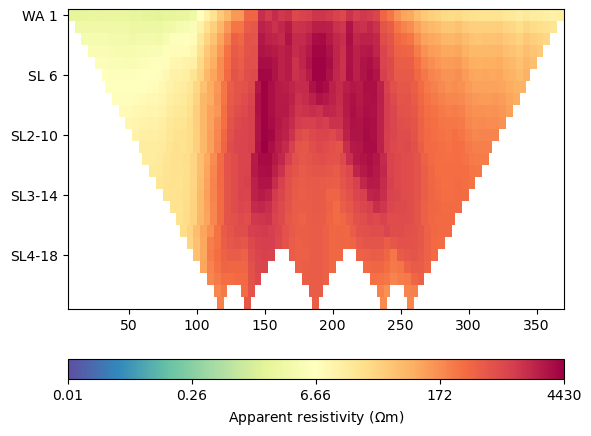

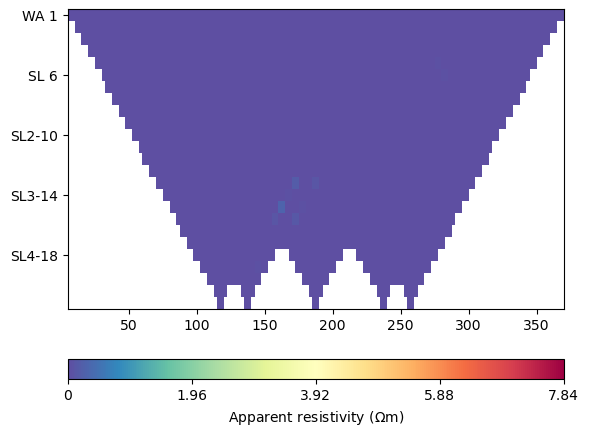

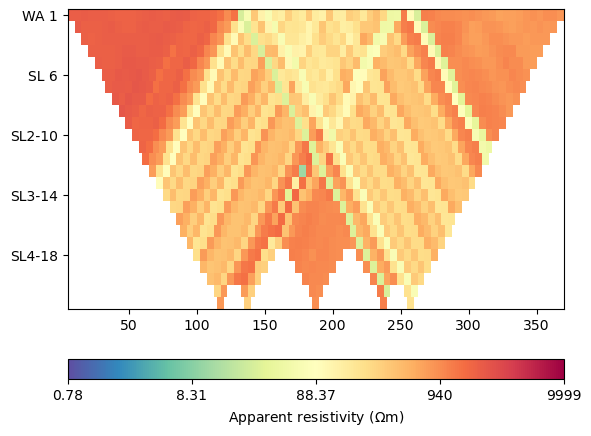

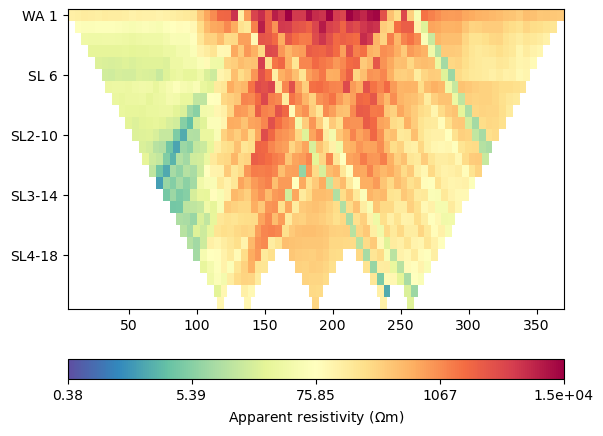

In [5]:
ert.show(data)
ert.show(data, data['err'])
ert.show(data, data['i'])
ert.show(data, data['u'])

(<Axes: >, <matplotlib.colorbar.Colorbar at 0x225fe5eaf50>)

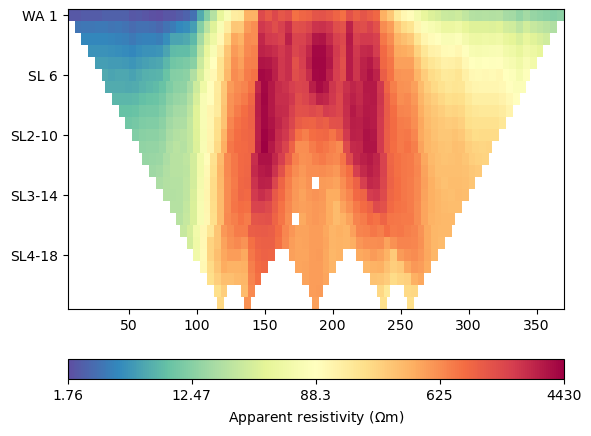

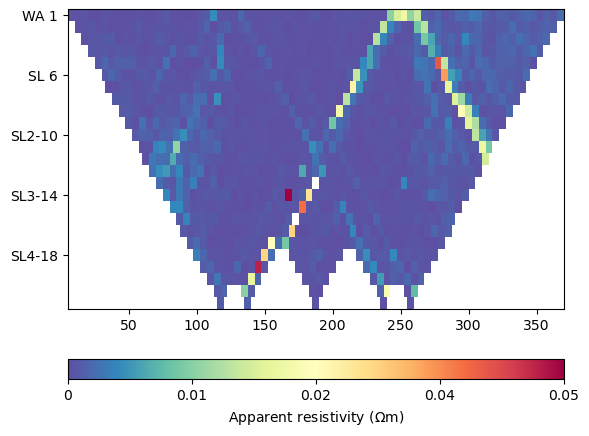

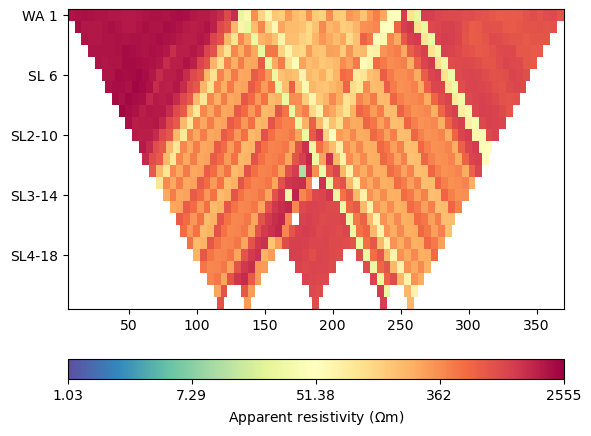

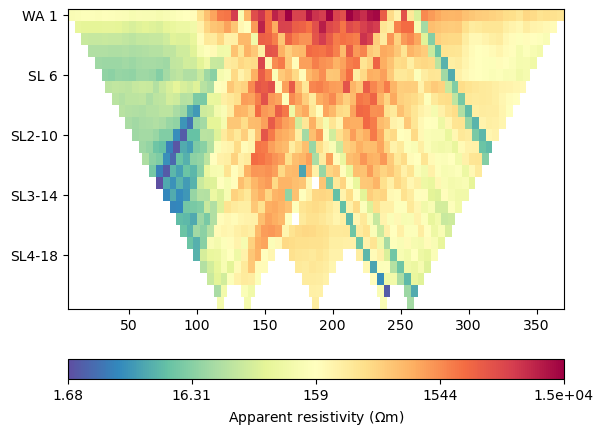

In [5]:
data.remove(data['err']>=0.05)
data.remove(data['i'] < 1)
data.remove(data['rhoa'] <= 0)
ert.show(data)
ert.show(data, data['err'])
ert.show(data, data['i'])
ert.show(data, data['u'])

In [6]:
data['err'] = data['err'] + ert.estimateError(data, relativeError=0.05, absoluteUError=5e-4)
#ert.show(data, data['err'])

In [7]:
data['k'] = ert.createGeometricFactors(data)
data.setSensorPositions(pg.meshtools.interpolateAlongCurve(data_topo.additionalPoints(), pg.x(data_topo)))
data['k_topo'] = ert.createGeometricFactors(data, numerical=True)

05/11/25 - 08:11:59 - pyGIMLi - INFO - Save RVector binary
05/11/25 - 08:11:59 - pyGIMLi - INFO - Cache stored: C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\5525260443626406259
05/11/25 - 08:11:59 - pyGIMLi - INFO - Create default mesh for geometric factor calculation.
05/11/25 - 08:12:18 - pyGIMLi - INFO - Save RVector binary
05/11/25 - 08:12:18 - pyGIMLi - INFO - Cache stored: C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\6177195105838931989


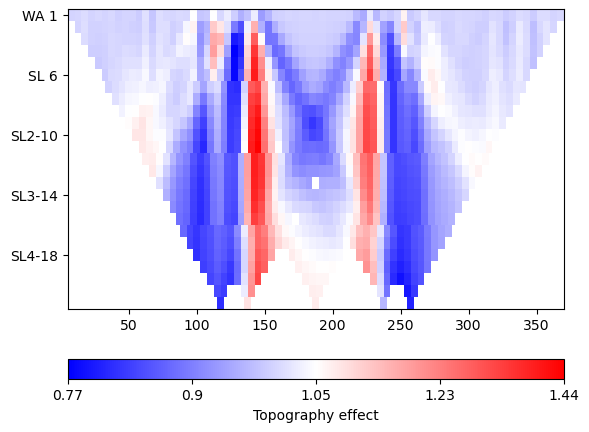

In [9]:
_ = ert.showData(data, vals=data['k_topo']/ data['k'], label='Topography effect',
                 logScale=True, cMap="bwr")

In [8]:
data['rhoa'] = data['r']*data['k_topo']

In [9]:
mgr = ert.ERTManager(data)

In [10]:
np.mean(data['rhoa'])

1088.3454176461014

27/10/25 - 15:37:36 - pyGIMLi - INFO - Found 2 regions.
27/10/25 - 15:37:36 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
27/10/25 - 15:37:36 - pyGIMLi - INFO - Found 2 regions.
27/10/25 - 15:37:36 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
27/10/25 - 15:37:36 - pyGIMLi - INFO - Creating forward mesh from region infos.
27/10/25 - 15:37:37 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
27/10/25 - 15:37:37 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 3780 Cells: 7028 Boundaries: 5536
27/10/25 - 15:37:37 - pyGIMLi - INFO - Use median(data values)=604.305484346947
27/10/25 - 15:37:37 - pyGIMLi - INFO - Created startmodel from forward operator:1504, min/max=604.305484/604.305484
27/10/25 - 15:37:37 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000280C5C28090>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 3%/4.91%
min/max (start model): 604/604
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3612.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  480.70 (dPhi = 86.61%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  163.71 (dPhi = 65.84%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   80.79 (dPhi = 50.20%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.06 (dPhi = 81.14%) lam: 20.

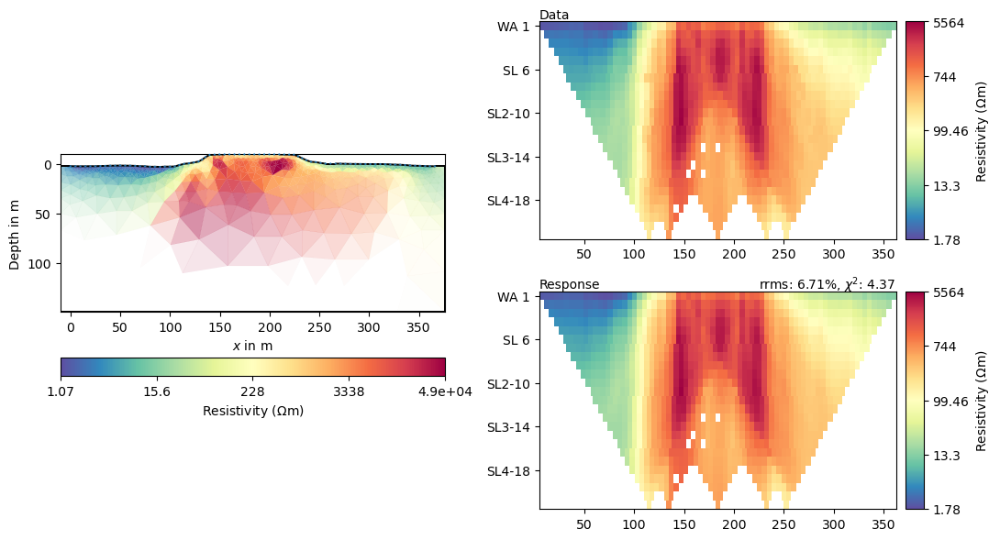

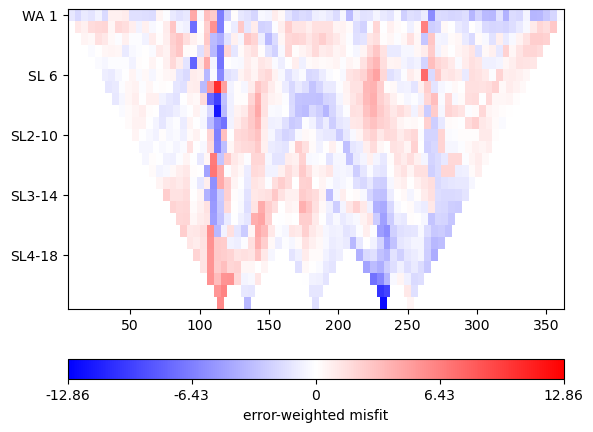

In [43]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, zWeight=0.9, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

27/10/25 - 15:02:35 - pyGIMLi - INFO - Use median(data values)=606.3544677957989
27/10/25 - 15:02:35 - pyGIMLi - INFO - Created startmodel from forward operator:4621, min/max=606.354468/606.354468


27/10/25 - 15:02:35 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000280FEF54220>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 3.02%/4.89%
min/max (start model): 606/606
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4189.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  480.37 (dPhi = 88.41%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  222.11 (dPhi = 53.81%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   63.37 (dPhi = 70.73%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.75 (dPhi = 72.57%) lam: 

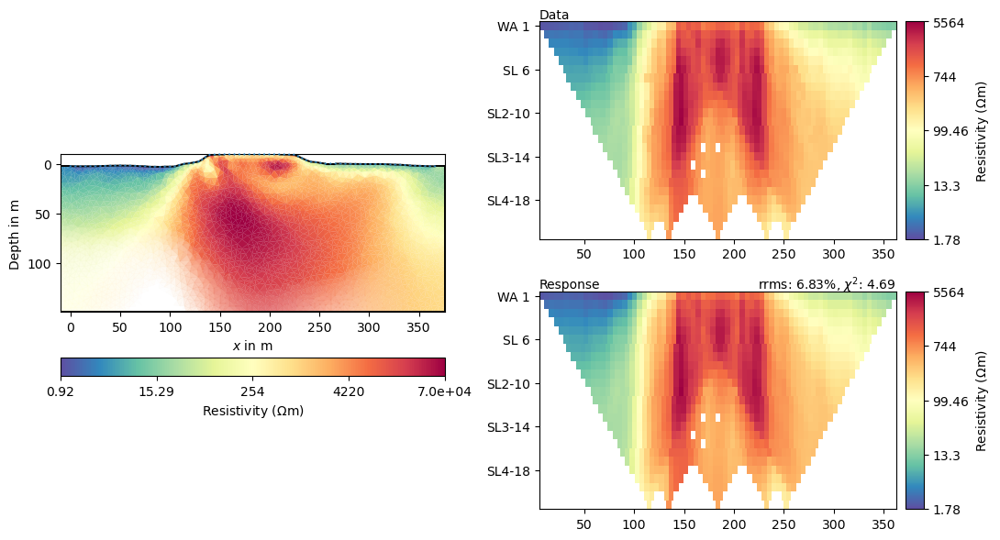

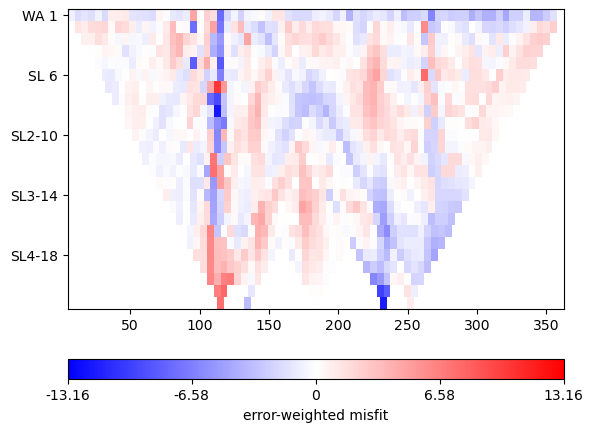

In [28]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, zWeight=0.9)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

27/10/25 - 13:56:26 - pyGIMLi - INFO - Found 2 regions.
27/10/25 - 13:56:26 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
27/10/25 - 13:56:26 - pyGIMLi - INFO - Creating forward mesh from region infos.
27/10/25 - 13:56:27 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
27/10/25 - 13:56:27 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 11310 Cells: 22084 Boundaries: 16830
27/10/25 - 13:56:27 - pyGIMLi - INFO - Use median(data values)=606.705577320678
27/10/25 - 13:56:27 - pyGIMLi - INFO - Created startmodel from forward operator:4621, min/max=606.705577/606.705577
27/10/25 - 13:56:27 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000186B2833650>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 2.82%/4.8%
min/max (start model): 607/607
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4208.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  480.71 (dPhi = 88.45%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  226.87 (dPhi = 52.87%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   63.31 (dPhi = 71.36%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.01 (dPhi = 72.16%) lam: 2

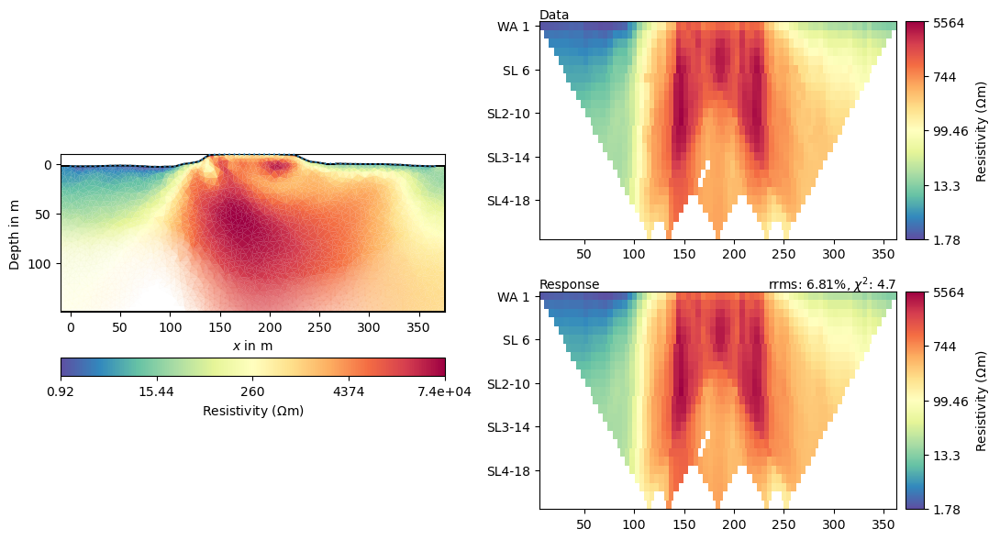

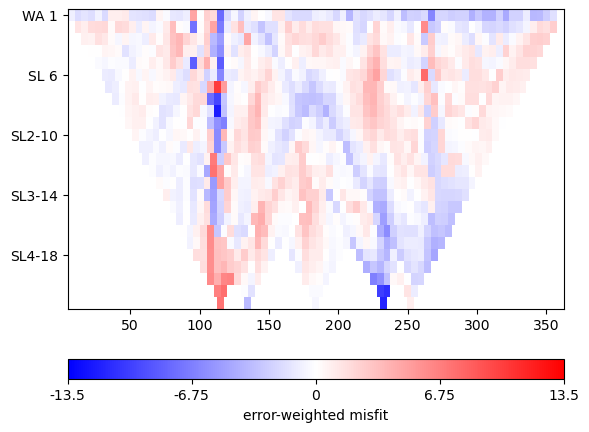

In [60]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, zWeight=0.9, mesh=mesh)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

27/10/25 - 10:56:59 - pyGIMLi - INFO - Found 2 regions.
27/10/25 - 10:56:59 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
27/10/25 - 10:56:59 - pyGIMLi - INFO - Creating forward mesh from region infos.
27/10/25 - 10:57:00 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
27/10/25 - 10:57:00 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 11310 Cells: 22084 Boundaries: 16830
27/10/25 - 10:57:01 - pyGIMLi - INFO - Use median(data values)=605.1544213089334
27/10/25 - 10:57:01 - pyGIMLi - INFO - Created startmodel from forward operator:4621, min/max=605.154421/605.154421
27/10/25 - 10:57:01 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000015B0A1F7A60>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 1.85%/4.23%
min/max (start model): 605/605
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 9176.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1356.87 (dPhi = 85.14%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  729.27 (dPhi = 46.32%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  213.76 (dPhi = 70.38%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   48.16 (dPhi = 76.52%) lam: 

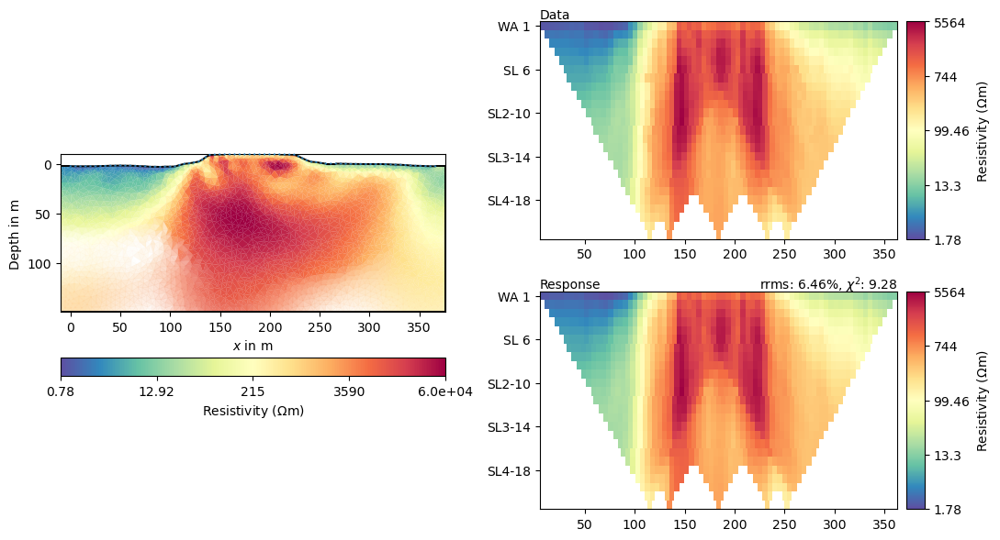

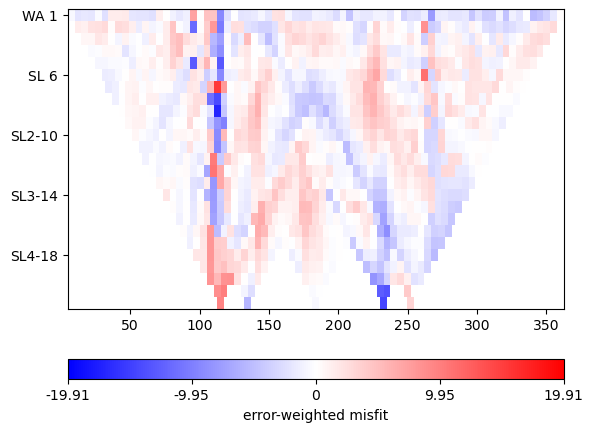

In [40]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, zWeight=0.9, mesh=mesh)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

27/10/25 - 10:30:11 - pyGIMLi - INFO - Found 2 regions.
27/10/25 - 10:30:11 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
27/10/25 - 10:30:11 - pyGIMLi - INFO - Creating forward mesh from region infos.
27/10/25 - 10:30:12 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
27/10/25 - 10:30:12 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 11310 Cells: 22084 Boundaries: 16830
27/10/25 - 10:30:13 - pyGIMLi - INFO - Use median(data values)=605.1544213089334
27/10/25 - 10:30:13 - pyGIMLi - INFO - Created startmodel from forward operator:4621, min/max=605.154421/605.154421
27/10/25 - 10:30:13 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000015B12B51170>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 1.86%/5.43%
min/max (start model): 605/605
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 9604.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1266.96 (dPhi = 86.73%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  608.19 (dPhi = 52.05%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  201.65 (dPhi = 66.47%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   50.77 (dPhi = 73.85%) lam: 

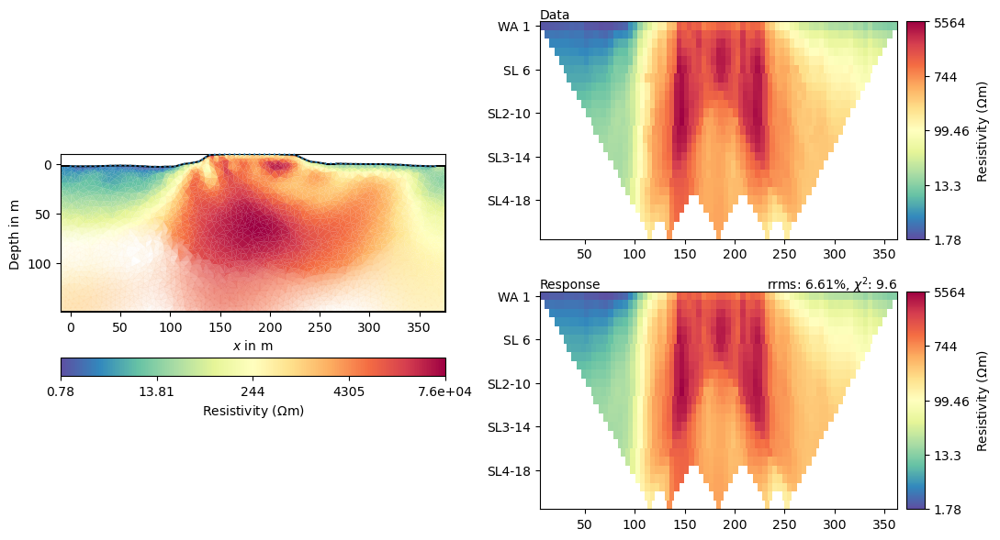

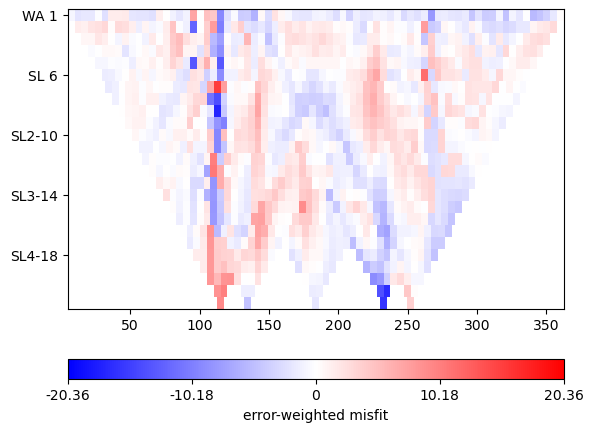

In [28]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, zWeight=0.9, mesh=mesh)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

16/10/25 - 15:12:14 - pyGIMLi - INFO - Found 2 regions.
16/10/25 - 15:12:14 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 15:12:14 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 15:12:15 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 15:12:16 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 23502 Cells: 46452 Boundaries: 35114
16/10/25 - 15:12:18 - pyGIMLi - INFO - Use median(data values)=586.0887453114137
16/10/25 - 15:12:18 - pyGIMLi - INFO - Created startmodel from forward operator:10157, min/max=586.088745/586.088745
16/10/25 - 15:12:18 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027AD8161F80>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 3%/4.98%
min/max (start model): 586/586
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3724.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  446.04 (dPhi = 87.89%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  234.26 (dPhi = 47.66%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   52.40 (dPhi = 76.75%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.46 (dPhi = 58.52%) lam: 20.

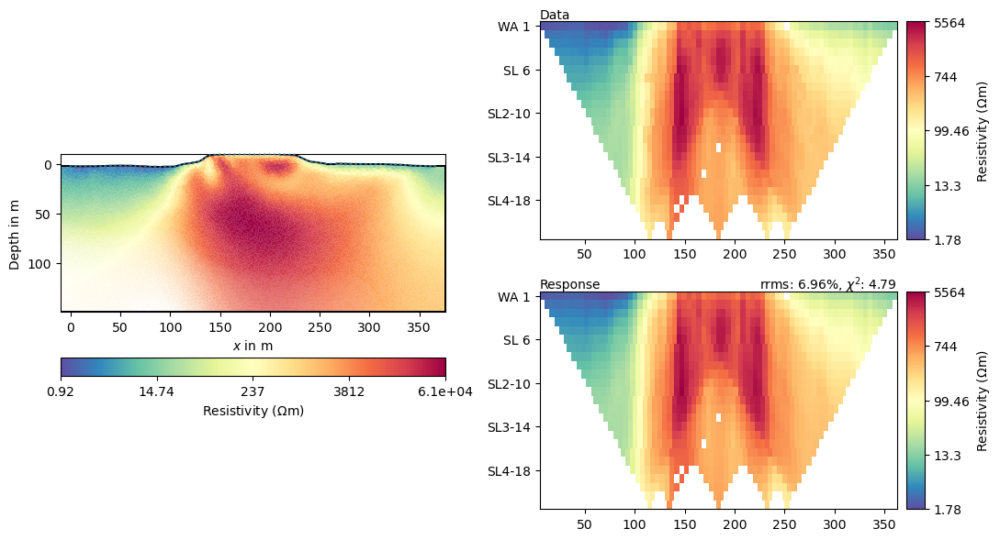

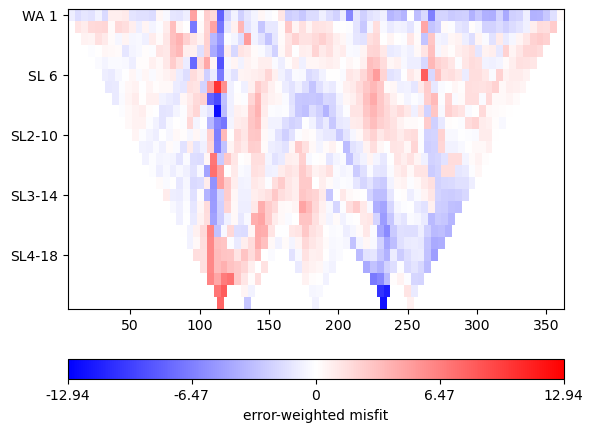

In [109]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, zWeight=0.9, mesh=mesh)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x27ad7f91fd0>)

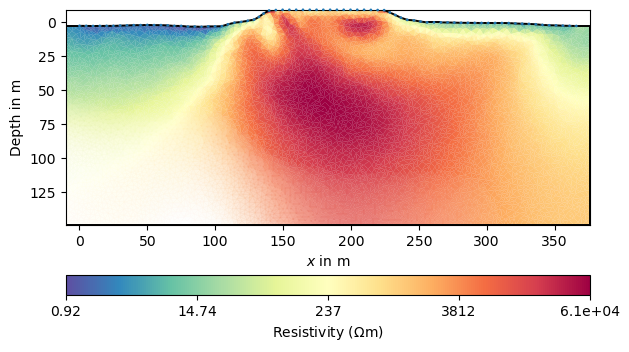

In [111]:
mgr.showResult()

15/10/25 - 12:03:32 - pyGIMLi - INFO - Found 2 regions.
15/10/25 - 12:03:32 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 12:03:32 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 12:03:33 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 12:03:34 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 23502 Cells: 46452 Boundaries: 35114
15/10/25 - 12:03:35 - pyGIMLi - INFO - Use median(data values)=606.705575028044
15/10/25 - 12:03:35 - pyGIMLi - INFO - Created startmodel from forward operator:10157, min/max=606.705575/606.705575
15/10/25 - 12:03:35 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001A99AD089F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 3%/6%
min/max (start model): 607/607
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3628.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  866.97 (dPhi = 76.06%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  265.13 (dPhi = 69.30%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   67.68 (dPhi = 74.02%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.23 (dPhi = 74.42%) lam: 20.0
-

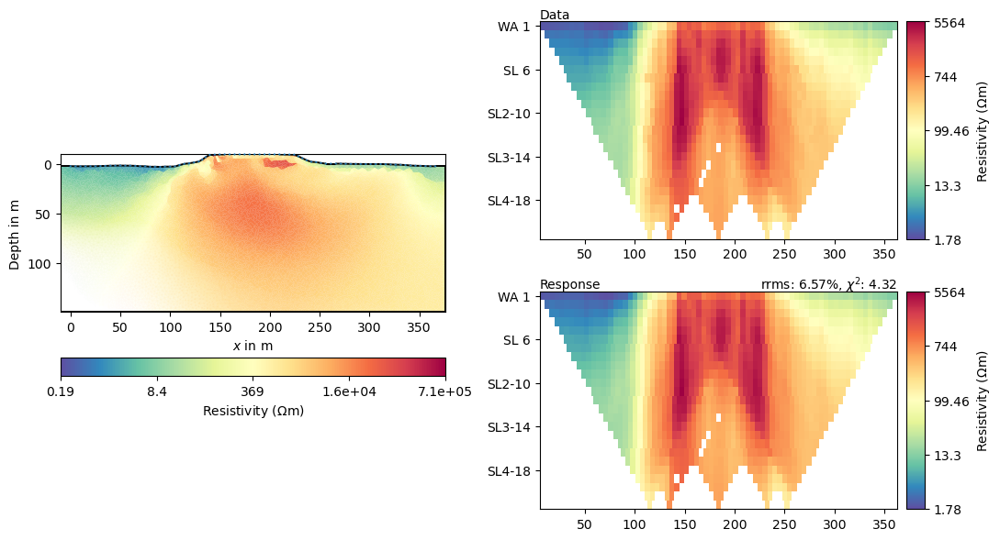

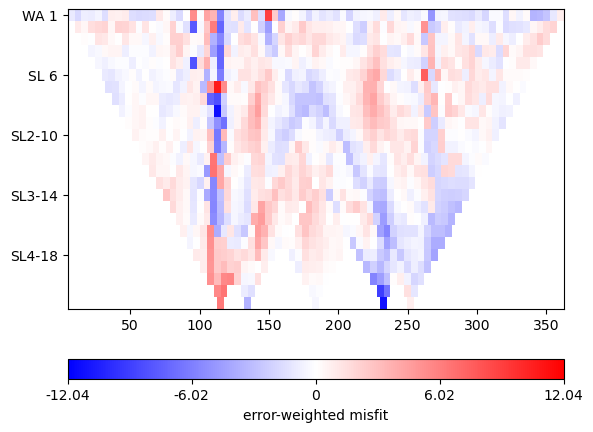

In [68]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, blockyModel=True, zWeight=0.9, mesh=mesh)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

15/10/25 - 10:55:55 - pyGIMLi - INFO - Found 2 regions.
15/10/25 - 10:55:55 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 10:55:55 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 10:55:55 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 10:55:55 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 11310 Cells: 22084 Boundaries: 16830
15/10/25 - 10:55:56 - pyGIMLi - INFO - Use median(data values)=606.705575028044
15/10/25 - 10:55:56 - pyGIMLi - INFO - Created startmodel from forward operator:4621, min/max=606.705575/606.705575
15/10/25 - 10:55:56 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001A99AD089F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 3%/6%
min/max (start model): 607/607
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3628.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  882.19 (dPhi = 75.64%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  326.18 (dPhi = 62.91%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   42.01 (dPhi = 86.71%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.64 (dPhi = 78.75%) lam: 20.0
-

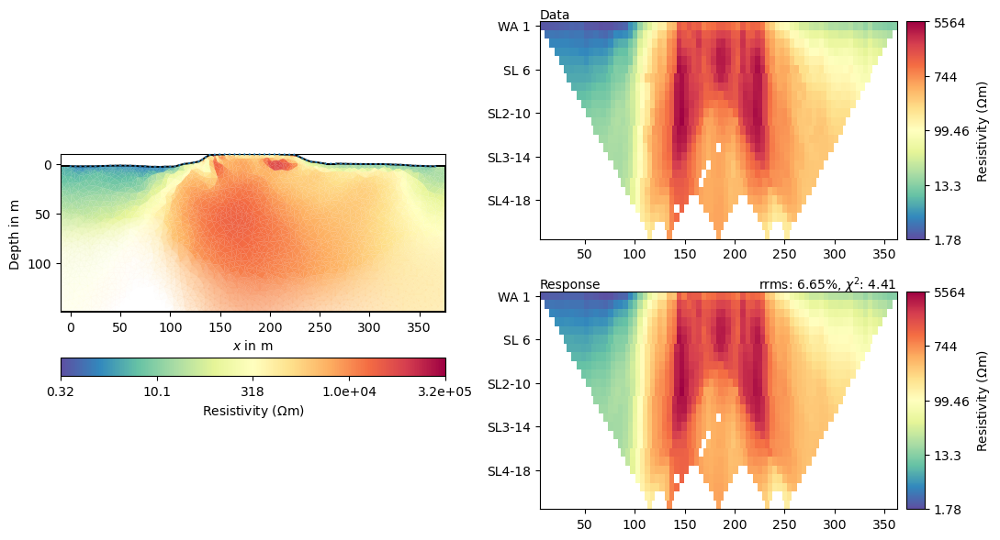

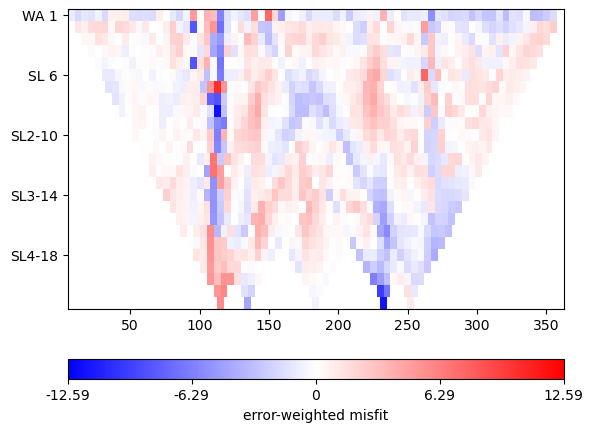

In [63]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, blockyModel=True, zWeight=0.9, mesh=mesh)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

15/10/25 - 10:38:15 - pyGIMLi - INFO - Found 2 regions.
15/10/25 - 10:38:15 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 10:38:15 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 10:38:15 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 10:38:15 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 11310 Cells: 22084 Boundaries: 16830
15/10/25 - 10:38:16 - pyGIMLi - INFO - Use median(data values)=606.705575028044
15/10/25 - 10:38:16 - pyGIMLi - INFO - Created startmodel from forward operator:4621, min/max=606.705575/606.705575
15/10/25 - 10:38:16 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001A99AD089F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 3%/6%
min/max (start model): 607/607
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3628.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  771.81 (dPhi = 78.67%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  293.13 (dPhi = 61.90%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   42.27 (dPhi = 85.10%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.43 (dPhi = 70.31%) lam: 20.0
-

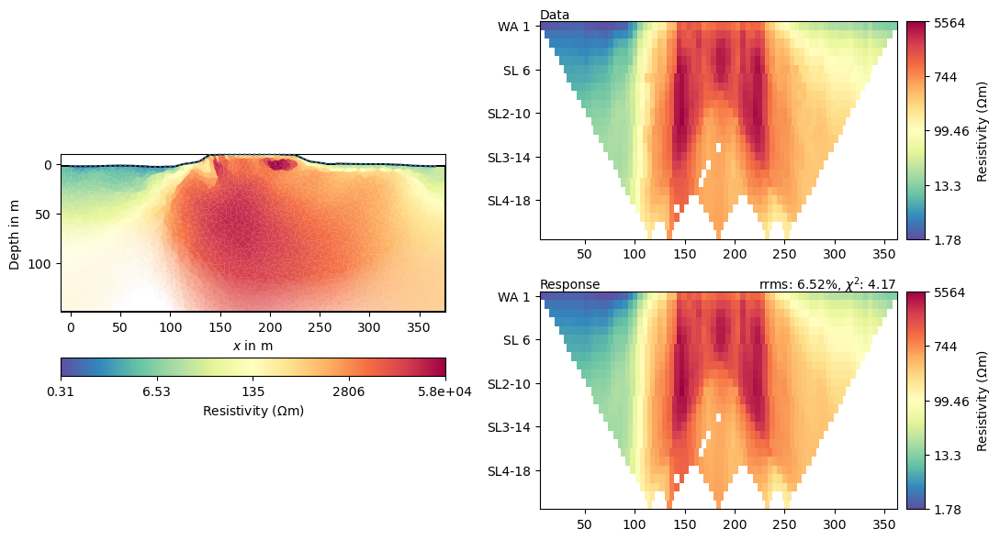

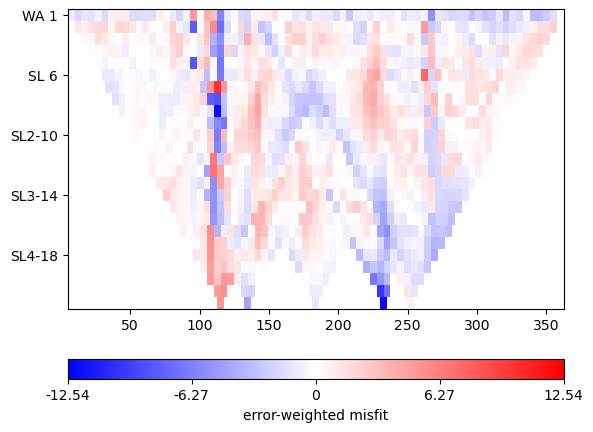

In [62]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, blockyModel=True, zWeight=0.5, mesh=mesh)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

15/10/25 - 10:21:15 - pyGIMLi - INFO - Found 2 regions.
15/10/25 - 10:21:15 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 10:21:15 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 10:21:16 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 10:21:16 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 11310 Cells: 22084 Boundaries: 16830
15/10/25 - 10:21:17 - pyGIMLi - INFO - Use median(data values)=606.705575028044
15/10/25 - 10:21:17 - pyGIMLi - INFO - Created startmodel from forward operator:4621, min/max=606.705575/606.705575
15/10/25 - 10:21:17 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001A99AD089F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.78/5564
min/max (error): 3%/6%
min/max (start model): 607/607
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3628.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  517.96 (dPhi = 85.66%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   88.41 (dPhi = 79.43%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   22.60 (dPhi = 69.14%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.35 (dPhi = 75.82%) lam: 20.0
-

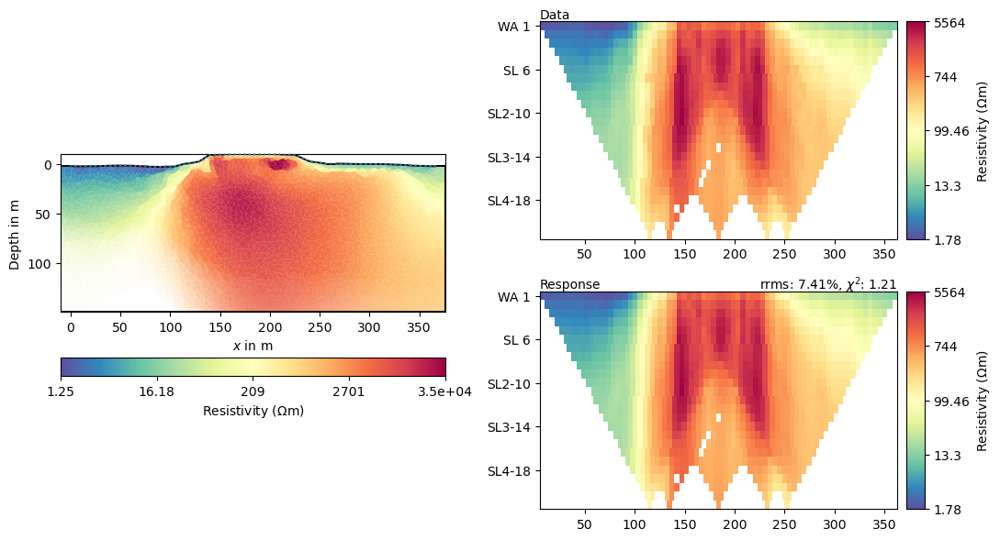

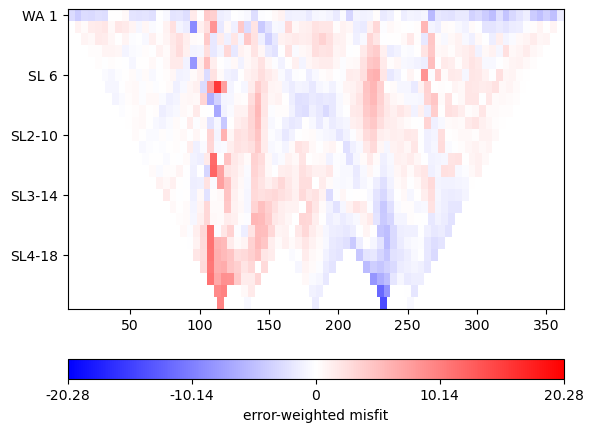

In [61]:
mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, blockyModel=True, robustData=True, zWeight=0.5, mesh=mesh)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

11/05/25 - 19:56:19 - pyGIMLi - INFO - Found 2 regions.
11/05/25 - 19:56:19 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/05/25 - 19:56:19 - pyGIMLi - INFO - Found 2 regions.
11/05/25 - 19:56:19 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/05/25 - 19:56:20 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/05/25 - 19:56:20 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/05/25 - 19:56:20 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 12050 Cells: 23556 Boundaries: 17938
11/05/25 - 19:56:20 - pyGIMLi - INFO - Use median(data values)=605.1544214116204
11/05/25 - 19:56:20 - pyGIMLi - INFO - Created startmodel from forward operator:4793, min/max=605.154421/605.154421
11/05/25 - 19:56:20 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001E27EDCA5C0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 1.78/5564
min/max (error): 2%/2831%
min/max (start model): 605/605
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1725.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  154.68 (dPhi = 90.84%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.43 (dPhi = 73.50%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.47 (dPhi = 73.75%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.01 (dPhi = 57.49%) lam: 20.0
----------------------------------------------------

Text(129.2041457109214, 0.5, 'y (m)')

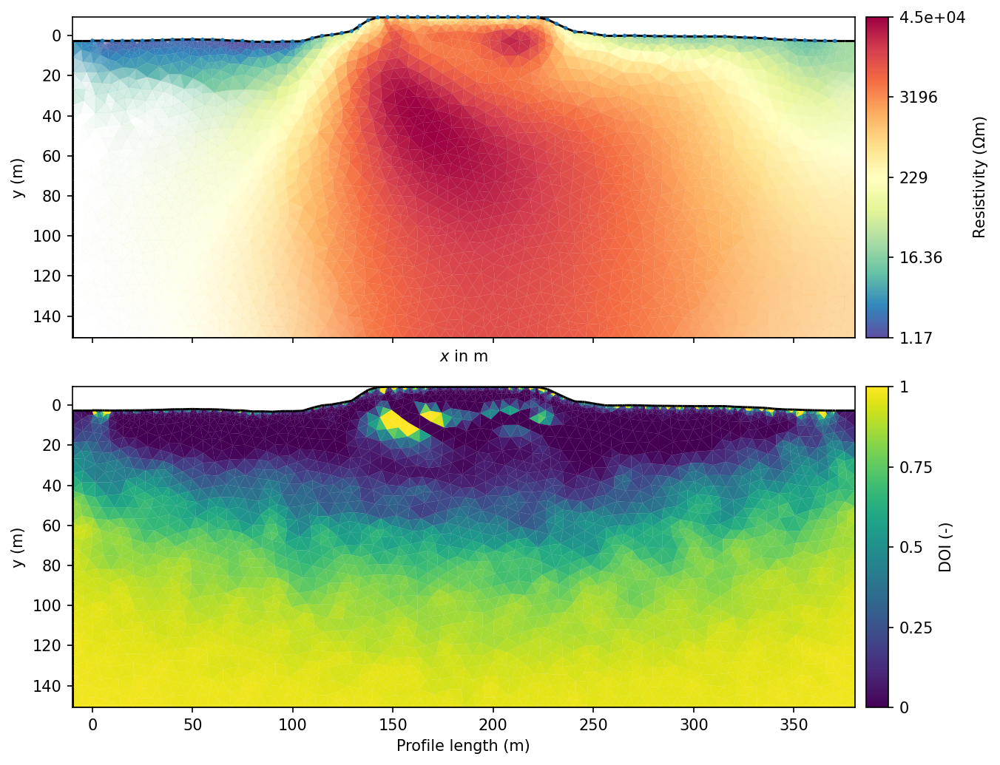

In [7]:
inv = mgr.invert(lam=20, verbose=True, paraDX=0.25, paraDZ=0.25, paraMaxCellSize=25)
def run_inv(referencemodel):
    # Set reference model as startmodel
    mgr.inv.inv.setModel(referencemodel)

    # Set reference model
    rm = mgr.inv.fop.regionManager()
    rm.setConstraintType(10) # 0 = reference model, 1 = first-order smoothing (default), 10 = both
    rm.fillConstraints(mgr.inv.fop.constraints())
    mgr.inv.inv.setReferenceModel(referencemodel)
    model = mgr.inv.inv.run()
    return model

def compute_DOI(ref1, ref2):
    m1 = run_inv(ref1)
    m2 = run_inv(ref2)

    R = (m1 - m2) / (m1r - m2r)
    return R


m1r = np.ones(mgr.paraDomain.cellCount()) * 100
m2r = np.ones(mgr.paraDomain.cellCount()) * 10000

DOI = compute_DOI(m1r, m2r)

fig, (ax1,ax2) = plt.subplots(2, 1, figsize=(10,7), dpi=150, sharex=True)

mgr.showResult(ax=ax1, orientation="vertical")
#ax1.set_xlabel("Profile length")
ax1.set_ylabel("y (m)")
pg.show(mgr.paraDomain, DOI, ax=ax2, cMin=0, cMax=1, orientation="vertical", label="DOI (-)")
ax2.set_xlabel("Profile length (m)")
ax2.set_ylabel("y (m)")


C:\Users\mealiy001\AppData\Local\Temp\ipykernel_36740\3554076232.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks])


Text(109.08333333333333, 0.5, 'Relative Elevation (m)')

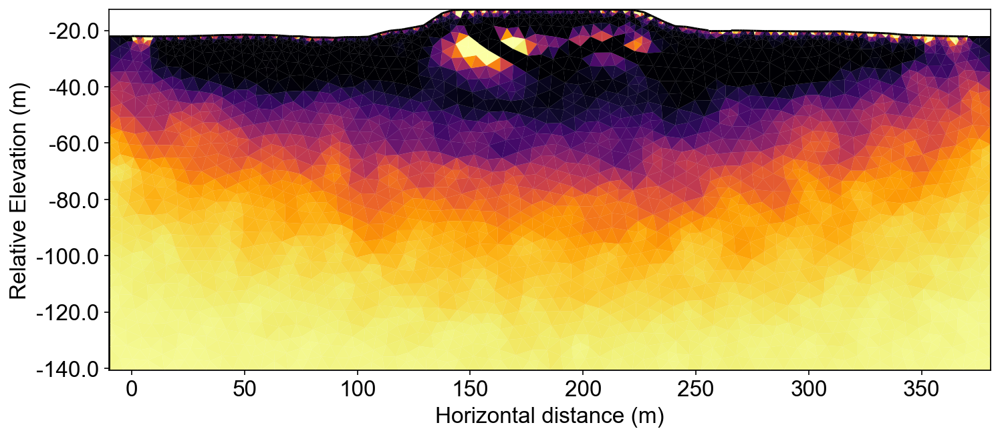

In [16]:
fig, (ax) = plt.subplots(1, 1, figsize=(10,5), dpi=150, sharex=True)
plt.rcParams['font.size'] = 16
plt.rcParams['font.family'] = 'Arial'
mgr.showResult(ax=ax1, orientation="vertical")
#ax1.set_xlabel("Profile length")
#ax1.set_ylabel("y (m)")
pg.show(mgr.paraDomain, DOI, ax=ax, cMin=0, cMax=1, orientation="vertical", label="DOI", cMap='inferno', colorBar=False)
ax.set_xlabel("Horizontal distance (m)")
ax.set_ylabel("y (m)")
current_ticks = ax.get_yticks()
relative_ticks = current_ticks   # Assuming 17 is the minimum elevation

# Set the new tick labels to show relative elevation

ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks])
ax.set_ylabel("Relative Elevation (m)", fontsize=16)

In [17]:
mesh = mgr.paraDomain
mesh["DOI"] = DOI


mesh.exportVTK(dir+'pygimli/all_inversions/east_amph_DOI.vtk')

Text(87.33333333333333, 0.5, 'y (m)')

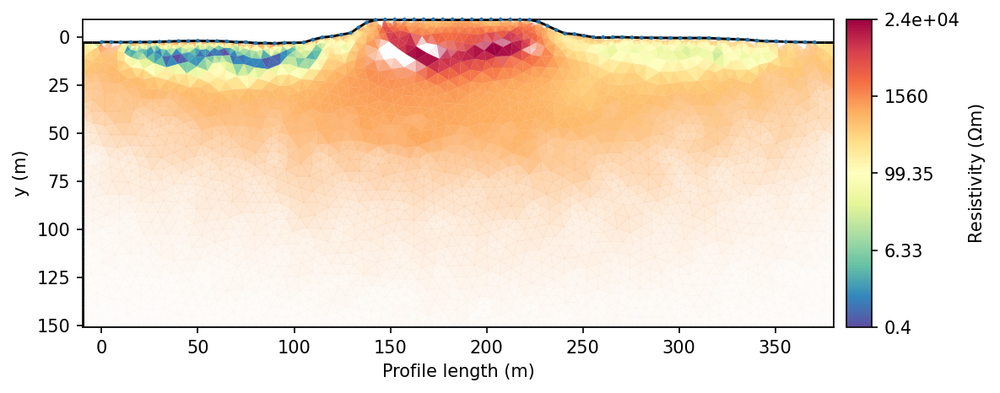

In [22]:
import numpy as np

def doi_to_transparency(doi, doiThreshold=0.2, maxDOI=1):
    """
    Convert DOI values into transparency values for visualization.

    Parameters:
        doi (array-like): DOI values.
        doiThreshold (float): DOI value below which transparency is 1 (fully opaque).
        maxDOI (float): DOI value at which transparency is 0 (fully transparent).

    Returns:
        array-like: Transparency values (1 = opaque, 0 = fully transparent).
    """
    D = np.asarray(doi)
    
    # Initialize alpha (transparency) array
    alpha = np.ones_like(D)  # Default to fully opaque

    # Apply gradual transparency beyond the DOI threshold
    mask = D > doiThreshold
    alpha[mask] = 1.0 - (D[mask] - doiThreshold) / (maxDOI - doiThreshold)

    # Cap values to ensure transparency is within [0,1]
    alpha = np.clip(alpha, 0, 1)
    
    return alpha



#opacity = np.ones(mgr.paraDomain.cellCount())
#opacity[DOI > 0.2] = 0
opacity = doi_to_transparency(DOI)
fig, ax = plt.subplots(1,1, figsize=(8,5), dpi=150)
mgr.showResult(ax=ax, coverage=opacity, orientation = "vertical")
#ax.set_title("Inverse model with cutoff")
ax.set_xlabel("Profile length (m)")
ax.set_ylabel("y (m)")

Text(87.33333333333333, 0.5, 'y (m)')

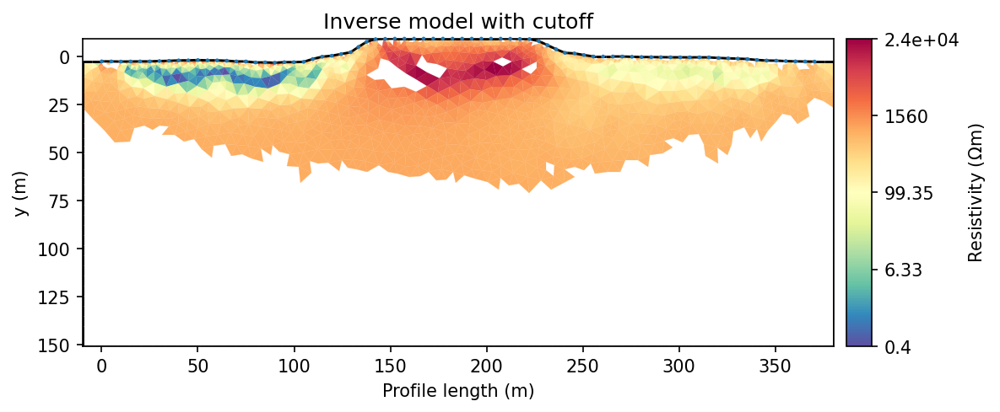

In [21]:
opacity = np.ones(mgr.paraDomain.cellCount())
opacity[DOI > 0.5] = 0
fig, ax = plt.subplots(1,1, figsize=(8,5), dpi=150)
mgr.showResult(ax=ax, coverage=opacity, orientation = "vertical")
ax.set_title("Inverse model with cutoff")
ax.set_xlabel("Profile length (m)")
ax.set_ylabel("y (m)")

0 -10.0 -2.524 0.0
1 -10.0 -150.85846355054932 0.0
2 380.5167860041571 -150.85846355054932 0.0
3 380.5167860041571 -2.6517491488864673 0.0
4 -1492.0671440166284 -2.524 0.0
5 -1492.0671440166284 -1632.797858418291 0.0
6 1862.5839300207854 -2.6517491488864673 0.0
7 1862.5839300207854 -1632.9256075671776 0.0
8 0.0 -2.524 0.0
9 1.2499516028108906 -2.5349995741047358 0.0
10 3.749854808432672 -2.5569987223142077 0.0
11 4.999806411243562 -2.5679982964189434 0.0
12 6.249658216467371 -2.587245694797942 0.0
13 8.749361826914988 -2.625740491555939 0.0
14 9.999213632138797 -2.6449878899349377 0.0
15 11.249135228533955 -2.630993997401589 0.0
16 13.74897842132427 -2.603006212334891 0.0
17 14.998900017719428 -2.5890123198015424 0.0
18 16.24887898062829 -2.581760956840592 0.0
19 18.748836906446023 -2.567258230918692 0.0
20 19.998815869354885 -2.5600068679577417 0.0
21 21.24880946594051 -2.556006118763748 0.0
22 23.74879665911176 -2.548004620375762 0.0
23 24.998790255697386 -2.5440038711817685 0.0
24 2

(-30.0, 381.0)

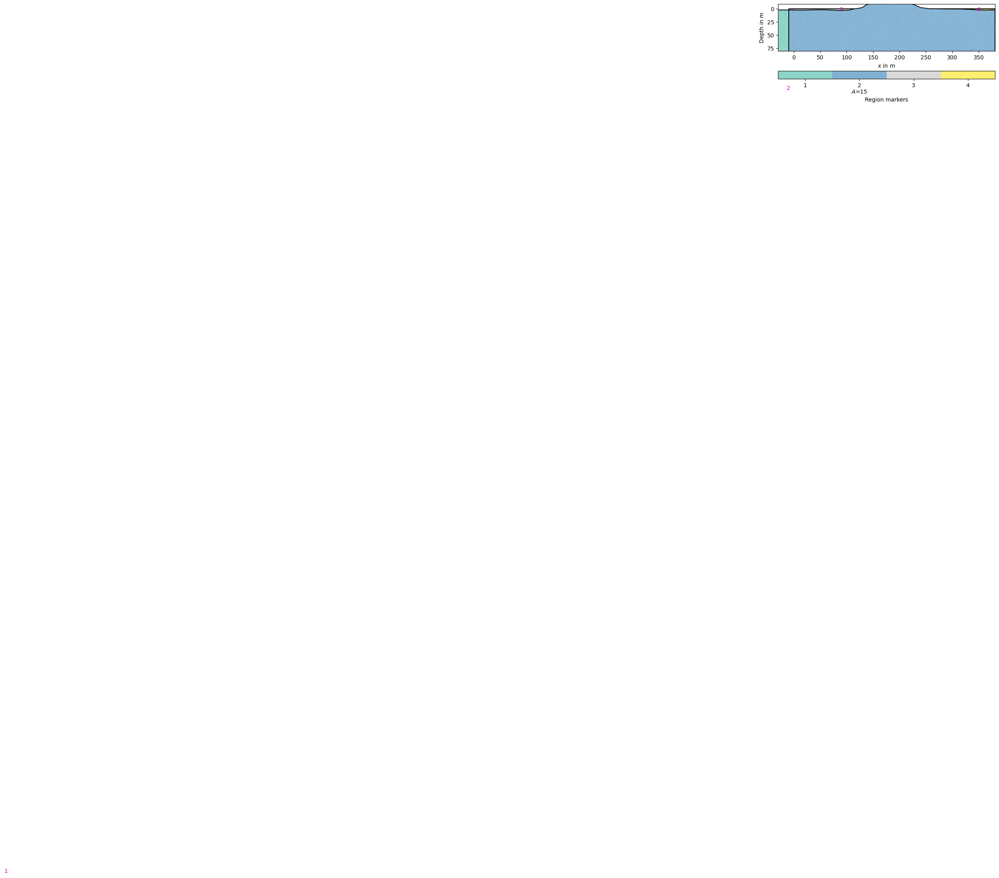

In [11]:
plc = mt.createParaMeshPLC(data,paraDX = 0.25, paraDZ= 0.25, paraMaxCellSize=15)
for i, n in enumerate(plc.nodes()[:]):
    #ax.text(n.x(), n.y(), str(i))
    print(i, n.x(), n.y(), n.z())
for nr, marker in enumerate(plc.regionMarkers()):
    print('Position marker number {}:'.format(nr + 1), marker.x(), marker.y(),
          marker.z())


plc.createNode(-10, 0, 0, marker=234)
#plc.createNode(113.5, 0, 0, marker=235)

plc.createNode(380.5167860041571, 0, 0, marker=235)

plc.createEdge(plc.node(234), plc.node(77), marker=-1)
plc.createEdge(plc.node(234), plc.node(0), marker=-1)
plc.createEdge(plc.node(164), plc.node(235), marker=-1)
plc.createEdge(plc.node(235), plc.node(3), marker=-1)

plc.addRegionMarker([90, -1], marker=3)  
plc.addRegionMarker([350, -1.5], marker=4)  

ax, _ = pg.show(plc)
ax.set_ylim(-80)
ax.set_xlim(-30,381)


In [12]:
mesh = mt.createMesh(plc, quality=34.5)
for b in mesh.boundaries():
    if b.marker() == -1 and not b.outside():
        b.setMarker(2)

#print(mesh)


: 

: 

In [ ]:
data
data['k_new'] = ert.createGeometricFactors(data, mesh=mesh, numerical=True)
data['rhoa'] = (data['r'])*data['k_new']

27/10/25 - 16:35:36 - pyGIMLi - INFO - Save RVector binary
27/10/25 - 16:35:36 - pyGIMLi - INFO - Cache stored: C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\7769188725835890835


In [119]:
lambdas = np.logspace(np.log10(1000), np.log10(10), num=20)
lambdas

array([1000.        ,  784.75997035,  615.84821107,  483.29302386,
        379.26901907,  297.63514416,  233.57214691,  183.29807108,
        143.84498883,  112.88378917,   88.58667904,   69.51927962,
         54.55594781,   42.81332399,   33.59818286,   26.36650899,
         20.69138081,   16.23776739,   12.74274986,   10.        ])

13/10/25 - 16:36:06 - pyGIMLi - INFO - Found 4 regions.
13/10/25 - 16:36:06 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
13/10/25 - 16:36:06 - pyGIMLi - INFO - Creating forward mesh from region infos.
13/10/25 - 16:36:06 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
13/10/25 - 16:36:07 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
13/10/25 - 16:36:08 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 16:36:08 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 16:36:08 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  779.45 (dPhi = 90.42%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  114.81 (dPhi = 81.79%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   47.89 (dPhi = 40.81%) lam: 1000.0
---

13/10/25 - 17:04:03 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 17:04:03 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 17:04:03 - pyGIMLi - INFO - Starting inversion.


chi² =   40.07 (dPhi = 1.76%) lam: 1000.0
################################################################################
#                Abort criterion reached: dPhi = 1.76 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  799.41 (dPhi = 90.24%) lam: 784

13/10/25 - 17:35:38 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 17:35:38 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 17:35:38 - pyGIMLi - INFO - Starting inversion.


chi² =   36.06 (dPhi = 0.60%) lam: 784.8
################################################################################
#                 Abort criterion reached: dPhi = 0.6 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  819.55 (dPhi = 90.05%) lam: 615.

13/10/25 - 18:08:07 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 18:08:07 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 18:08:07 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  837.83 (dPhi = 89.88%) lam: 483.3
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  111.77 (dPhi = 84.64%) lam: 483.3
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   47.29 (dPhi = 45.89%) lam: 483.3
------

13/10/25 - 18:41:09 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 18:41:09 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 18:41:09 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  859.50 (dPhi = 89.66%) lam: 379.3
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  116.76 (dPhi = 84.79%) lam: 379.3
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   48.74 (dPhi = 48.12%) lam: 379.3
------

13/10/25 - 19:17:52 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 19:17:52 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 19:17:52 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  882.27 (dPhi = 89.42%) lam: 297.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  123.52 (dPhi = 84.69%) lam: 297.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   52.26 (dPhi = 49.18%) lam: 297.6
------

13/10/25 - 19:55:02 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 19:55:02 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 19:55:02 - pyGIMLi - INFO - Starting inversion.


chi² =   25.25 (dPhi = 0.31%) lam: 297.6
################################################################################
#                Abort criterion reached: dPhi = 0.31 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  905.02 (dPhi = 89.17%) lam: 233.

13/10/25 - 20:32:18 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 20:32:18 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 20:32:18 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  940.29 (dPhi = 88.78%) lam: 183.3
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  144.29 (dPhi = 83.86%) lam: 183.3
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   51.27 (dPhi = 58.08%) lam: 183.3
------

13/10/25 - 21:14:19 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 21:14:19 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 21:14:19 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  984.15 (dPhi = 88.28%) lam: 143.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  169.03 (dPhi = 82.23%) lam: 143.8
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   54.63 (dPhi = 62.70%) lam: 143.8
------

13/10/25 - 22:00:45 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 22:00:45 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 22:00:45 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1038.39 (dPhi = 87.67%) lam: 112.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  209.75 (dPhi = 79.41%) lam: 112.9
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   71.38 (dPhi = 62.57%) lam: 112.9
------

13/10/25 - 22:47:25 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 22:47:25 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 22:47:25 - pyGIMLi - INFO - Starting inversion.


chi² =   19.35 (dPhi = 0.93%) lam: 112.9
################################################################################
#                Abort criterion reached: dPhi = 0.93 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1107.24 (dPhi = 86.88%) lam: 88.6

13/10/25 - 23:34:16 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
13/10/25 - 23:34:16 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
13/10/25 - 23:34:16 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1195.33 (dPhi = 85.87%) lam: 69.5
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  342.96 (dPhi = 71.19%) lam: 69.5
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  103.16 (dPhi = 68.22%) lam: 69.5
---------

14/10/25 - 00:36:16 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
14/10/25 - 00:36:16 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
14/10/25 - 00:36:16 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1283.65 (dPhi = 84.86%) lam: 54.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  407.57 (dPhi = 68.19%) lam: 54.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  121.77 (dPhi = 68.87%) lam: 54.6
---------

14/10/25 - 01:26:05 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
14/10/25 - 01:26:05 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
14/10/25 - 01:26:05 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1364.07 (dPhi = 83.94%) lam: 42.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  448.79 (dPhi = 67.05%) lam: 42.8
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  135.12 (dPhi = 68.89%) lam: 42.8
---------

14/10/25 - 02:20:19 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
14/10/25 - 02:20:19 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
14/10/25 - 02:20:19 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1455.50 (dPhi = 82.89%) lam: 33.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  522.96 (dPhi = 64.04%) lam: 33.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  141.90 (dPhi = 72.09%) lam: 33.6
---------

14/10/25 - 03:24:52 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
14/10/25 - 03:24:52 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
14/10/25 - 03:24:52 - pyGIMLi - INFO - Starting inversion.


chi² =   15.75 (dPhi = 1.06%) lam: 33.6
################################################################################
#                Abort criterion reached: dPhi = 1.06 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1549.74 (dPhi = 81.81%) lam: 26.4


14/10/25 - 04:29:16 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
14/10/25 - 04:29:16 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
14/10/25 - 04:29:16 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1641.51 (dPhi = 80.75%) lam: 20.7
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  629.02 (dPhi = 61.64%) lam: 20.7
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  174.10 (dPhi = 71.82%) lam: 20.7
---------

14/10/25 - 05:29:23 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
14/10/25 - 05:29:23 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
14/10/25 - 05:29:23 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1723.89 (dPhi = 79.80%) lam: 16.2
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  745.29 (dPhi = 56.73%) lam: 16.2
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  194.99 (dPhi = 73.46%) lam: 16.2
---------

14/10/25 - 06:34:05 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
14/10/25 - 06:34:05 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
14/10/25 - 06:34:05 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1788.88 (dPhi = 79.05%) lam: 12.7
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  648.18 (dPhi = 63.73%) lam: 12.7
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  215.01 (dPhi = 66.43%) lam: 12.7
---------

14/10/25 - 07:40:25 - pyGIMLi - INFO - Use median(data values)=582.1116842026514
14/10/25 - 07:40:25 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=582.111684/582.111684
14/10/25 - 07:40:25 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014829AB81D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2%/6.84%
min/max (start model): 582/582
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8562.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1846.86 (dPhi = 78.39%) lam: 10.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  631.91 (dPhi = 65.75%) lam: 10.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  222.29 (dPhi = 64.44%) lam: 10.0
---------

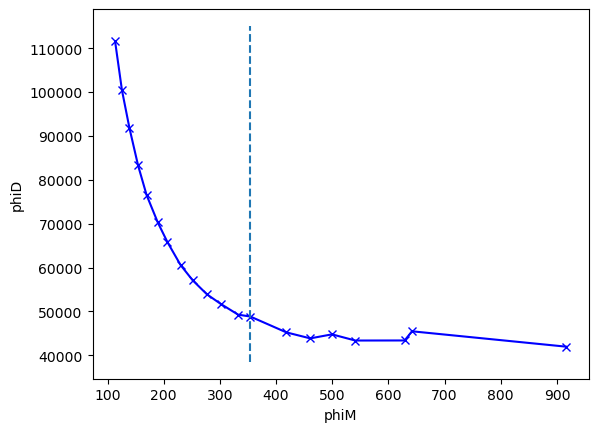

In [120]:
mgr.setMesh(mesh)


mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)

lambdas = np.logspace(np.log10(1000), np.log10(10), num=20)
phiD = []
phiM = []
for lam in lambdas:
    mgr.invert(data, lam=lam, verbose=True)
    phiD.append(mgr.inv.phiData())
    phiM.append(mgr.inv.phiModel())

phiD = np.array(phiD)
phiM = np.array(phiM)

from kneed import DataGenerator, KneeLocator
kneedle = KneeLocator(phiM, phiD, online=True, curve="convex", direction="decreasing",interp_method='polynomial', polynomial_degree=3)

print(round(kneedle.elbow, 3))
print(round(kneedle.elbow_y, 3))
print(lambdas[np.where(phiM==kneedle.elbow)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')

276.951
53895.257
[112.88378917]


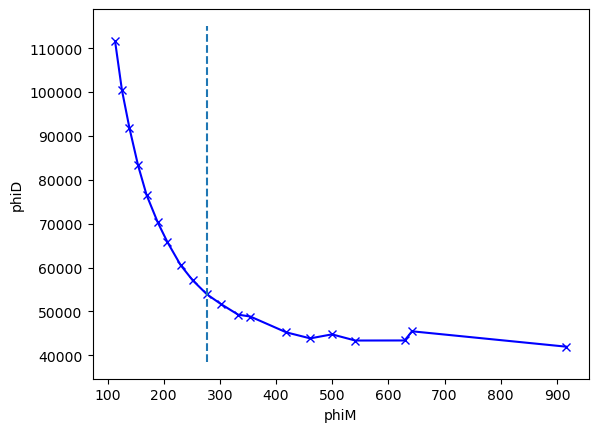

In [144]:
from kneed import DataGenerator, KneeLocator
kneedle = KneeLocator(phiM, phiD, online=True, curve="convex", direction="decreasing",interp_method='polynomial', polynomial_degree=5)

print(round(kneedle.elbow, 3))
print(round(kneedle.elbow_y, 3))
print(lambdas[np.where(phiM==kneedle.elbow)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')

Elbow (x): 276.951
Elbow (y): 53895.257


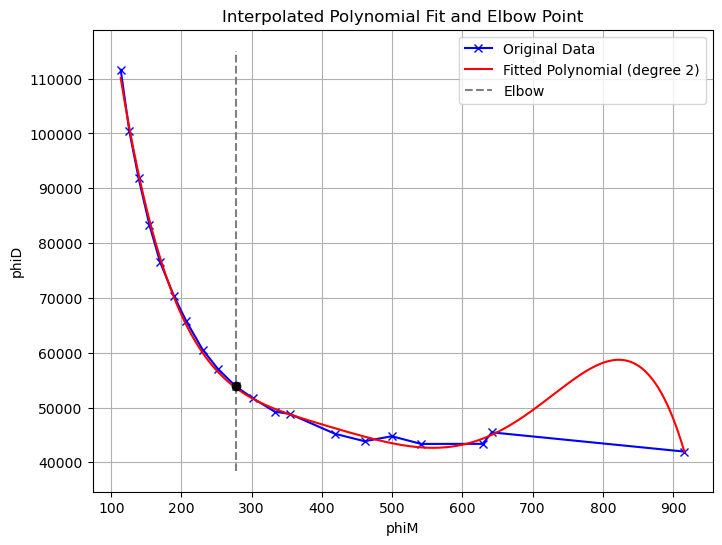

In [143]:
import numpy as np
import matplotlib.pyplot as plt
from kneed import KneeLocator

kneedle = KneeLocator(
    phiM, phiD,
    online=True,
    curve="convex",
    direction="decreasing",
    interp_method='polynomial',
    polynomial_degree=5
)

# --- Print knee location ---
print("Elbow (x):", round(kneedle.elbow, 3))
print("Elbow (y):", round(kneedle.elbow_y, 3))

# --- Recreate the interpolated polynomial fit manually ---
degree = 5  # same as polynomial_degree
coeffs = np.polyfit(phiM, phiD, degree)
poly = np.poly1d(coeffs)

# Generate smooth fitted curve
phiM_fit = np.linspace(min(phiM), max(phiM), 1000)
phiD_fit = poly(phiM_fit)

# --- Plot ---
plt.figure(figsize=(8,6))
plt.plot(phiM, phiD, 'bx-', label='Original Data')
plt.plot(phiM_fit, phiD_fit, 'r-', label='Fitted Polynomial (degree 2)')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', color='gray', label='Elbow')
plt.scatter(kneedle.elbow, kneedle.elbow_y, color='black', zorder=5)

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.legend()
plt.title('Interpolated Polynomial Fit and Elbow Point')
plt.grid(True)
plt.show()


301.622
51701.73
[88.58667904]


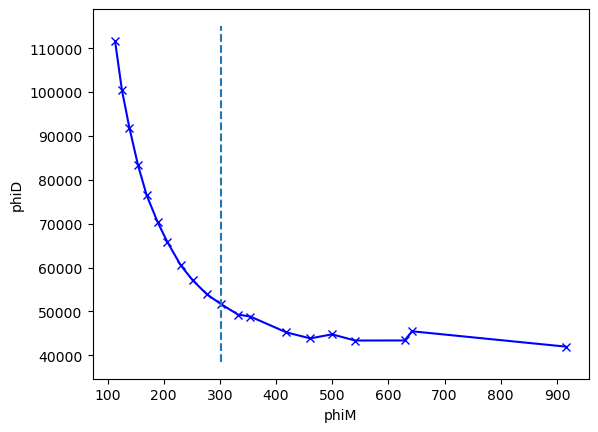

In [136]:
kneedle = KneeLocator(phiM, phiD, S=3.0, curve="convex", direction="decreasing",interp_method='interp1d')

print(round(kneedle.elbow, 3))
print(round(kneedle.knee_y, 3))
print(lambdas[np.where(phiM==kneedle.knee)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')

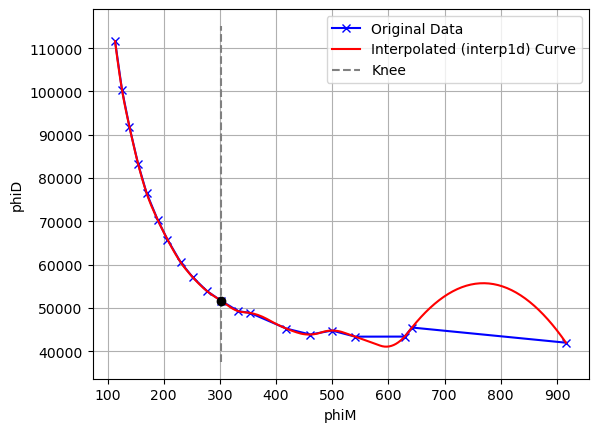

In [139]:
from scipy.interpolate import interp1d
import numpy as np
import matplotlib.pyplot as plt

# Create the same interpolation that KneeLocator uses
f_interp = interp1d(phiM, phiD, kind='quadratic')  # or 'cubic', 'quadratic' if you want to test

phiM_fit = np.linspace(min(phiM), max(phiM), 200)
phiD_fit = f_interp(phiM_fit)

plt.plot(phiM, phiD, 'bx-', label='Original Data')
plt.plot(phiM_fit, phiD_fit, 'r-', label='Interpolated (interp1d) Curve')
plt.vlines(kneedle.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', color='gray', label='Knee')
plt.scatter(kneedle.knee, kneedle.knee_y, color='black', zorder=5)
plt.xlabel('phiM')
plt.ylabel('phiD')
plt.legend()
plt.grid(True)
plt.show()

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x280b498a0d0>)

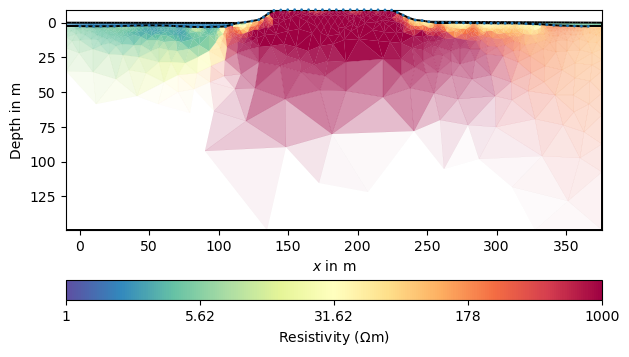

In [83]:
mgr.showResult(cMin=1, cMax=1000)

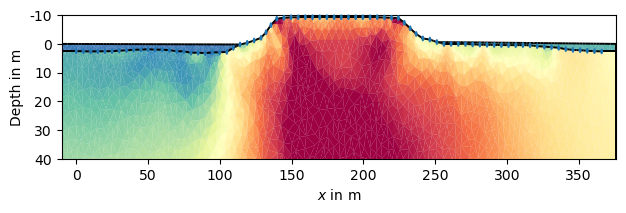

In [42]:
ax, cb = mgr.showResult(cMin=1, cMax=10000, colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

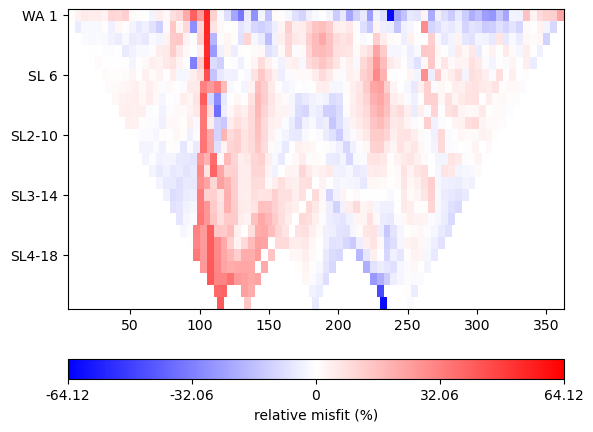

In [ ]:
mgr.showMisfit()

27/10/25 - 16:36:53 - pyGIMLi - INFO - Found 4 regions.
27/10/25 - 16:36:53 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
27/10/25 - 16:36:53 - pyGIMLi - INFO - Creating forward mesh from region infos.
27/10/25 - 16:36:54 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
27/10/25 - 16:36:55 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
27/10/25 - 16:36:56 - pyGIMLi - INFO - Use median(data values)=587.9722541759679
27/10/25 - 16:36:56 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=587.972254/587.972254
27/10/25 - 16:36:56 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000280B09DC7C0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/4.99%
min/max (start model): 588/588
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4045.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  620.86 (dPhi = 84.58%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  165.88 (dPhi = 67.31%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   44.05 (dPhi = 68.25%) lam: 20.0
---------

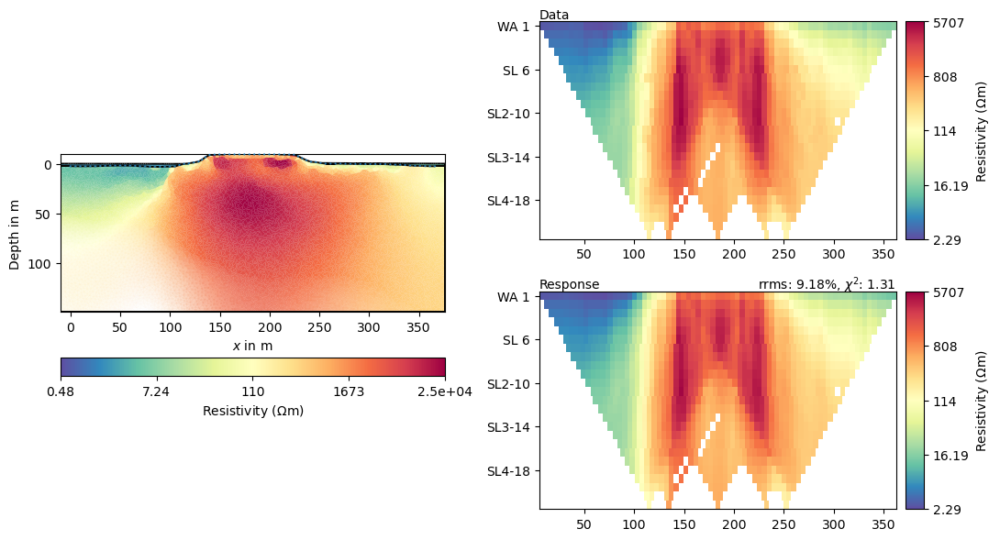

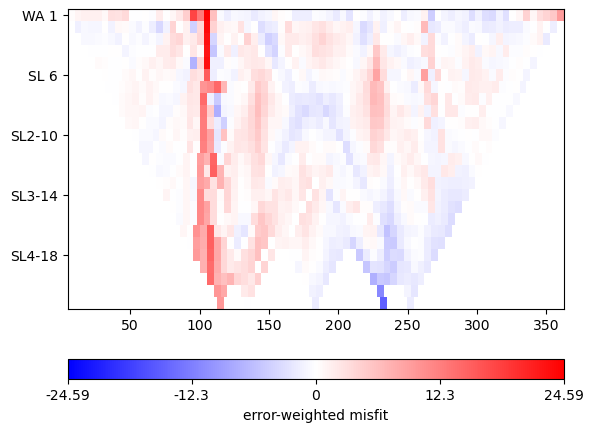

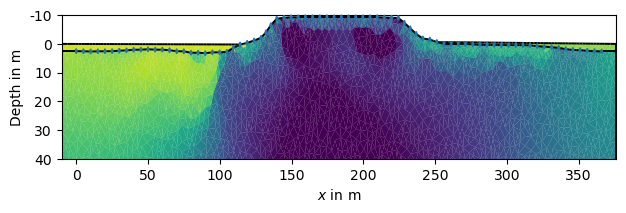

In [98]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2)
inv = mgr.invert(lam=20, zWeight=0.9, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

27/10/25 - 16:20:23 - pyGIMLi - INFO - Found 4 regions.
27/10/25 - 16:20:23 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
27/10/25 - 16:20:23 - pyGIMLi - INFO - Creating forward mesh from region infos.
27/10/25 - 16:20:24 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
27/10/25 - 16:20:24 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 5607 Cells: 10640 Boundaries: 8266
27/10/25 - 16:20:24 - pyGIMLi - INFO - Use median(data values)=583.2209466993568
27/10/25 - 16:20:24 - pyGIMLi - INFO - Created startmodel from forward operator:2395, min/max=583.220947/583.220947
27/10/25 - 16:20:24 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000280B4E9C6D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2.86%/4.77%
min/max (start model): 583/583
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3963.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  616.35 (dPhi = 84.38%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  201.31 (dPhi = 59.96%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   36.47 (dPhi = 74.83%) lam: 20.0
------

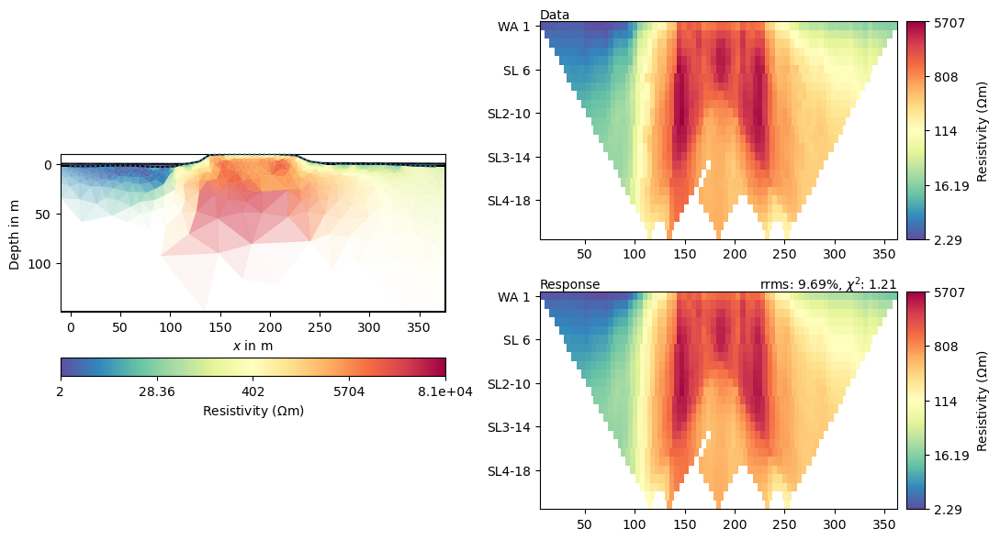

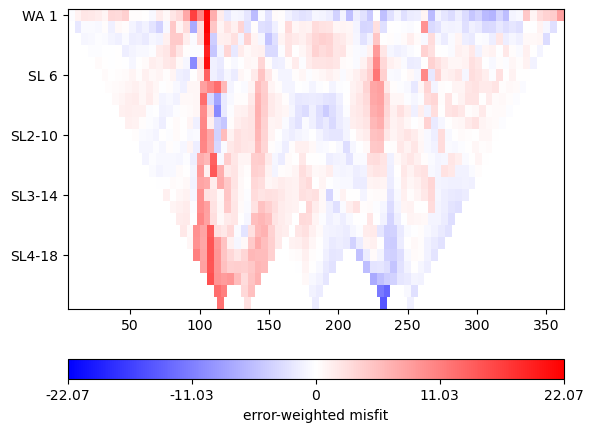

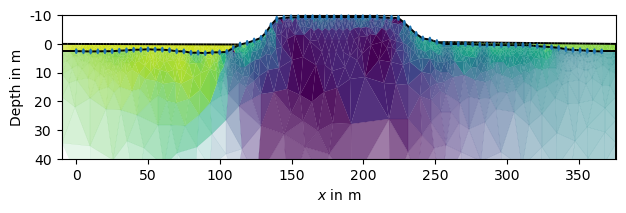

In [82]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

27/10/25 - 16:05:23 - pyGIMLi - INFO - Found 4 regions.
27/10/25 - 16:05:23 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
27/10/25 - 16:05:23 - pyGIMLi - INFO - Creating forward mesh from region infos.
27/10/25 - 16:05:23 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
27/10/25 - 16:05:23 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 5607 Cells: 10640 Boundaries: 8266
27/10/25 - 16:05:24 - pyGIMLi - INFO - Use median(data values)=584.3212848754729
27/10/25 - 16:05:24 - pyGIMLi - INFO - Created startmodel from forward operator:2395, min/max=584.321285/584.321285
27/10/25 - 16:05:24 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028140AC02C0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 2.83%/4.99%
min/max (start model): 584/584
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3429.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  612.38 (dPhi = 82.06%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  185.16 (dPhi = 62.61%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   33.71 (dPhi = 74.50%) lam: 20.0
------

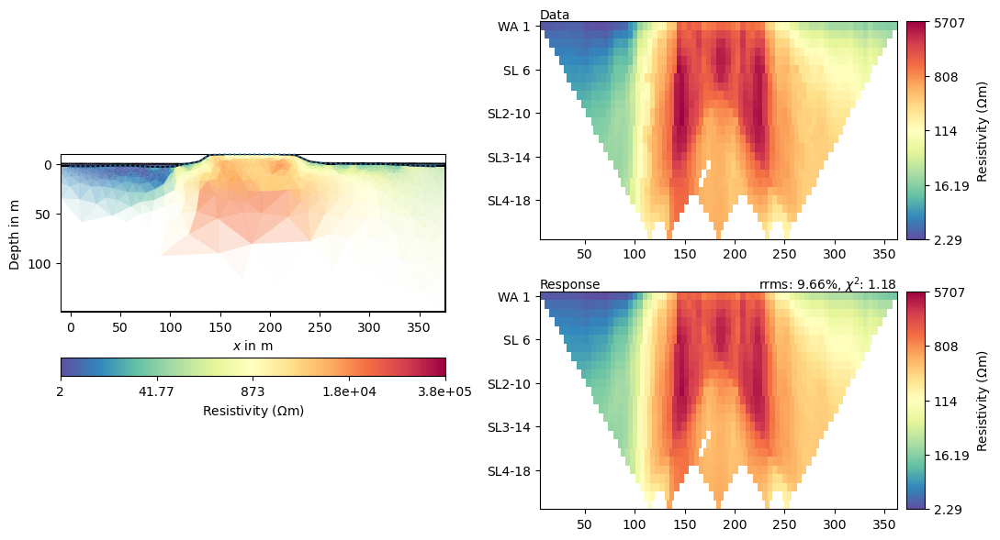

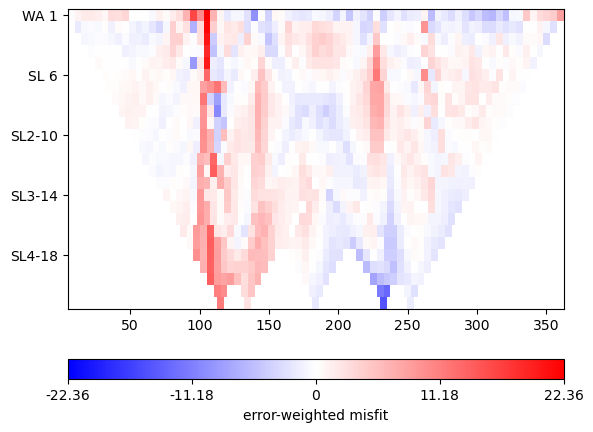

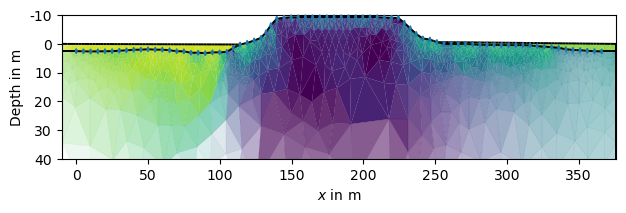

In [64]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

24/10/25 - 10:11:06 - pyGIMLi - INFO - Found 2 regions.
24/10/25 - 10:11:06 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
24/10/25 - 10:11:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
24/10/25 - 10:11:07 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
24/10/25 - 10:11:08 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 16571 Cells: 32608 Boundaries: 24722
24/10/25 - 10:11:10 - pyGIMLi - INFO - Use median(data values)=597.8872126976023
24/10/25 - 10:11:10 - pyGIMLi - INFO - Created startmodel from forward operator:7076, min/max=597.887213/597.887213
24/10/25 - 10:11:10 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014D6AC083B0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.77/5751
min/max (error): 3%/4.99%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4187.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  506.90 (dPhi = 87.75%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  181.68 (dPhi = 56.57%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   18.22 (dPhi = 84.75%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.73 (dPhi = 51.99%) lam: 20.

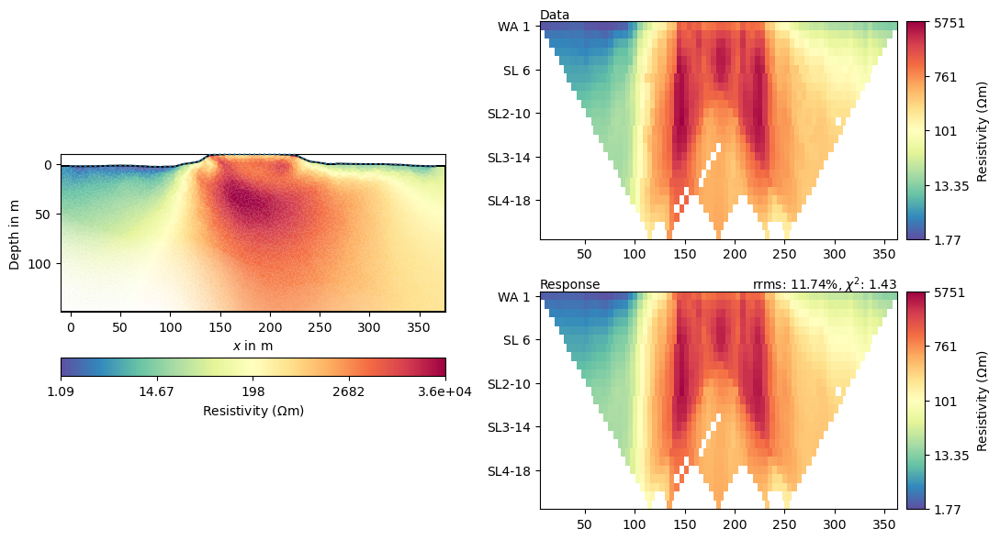

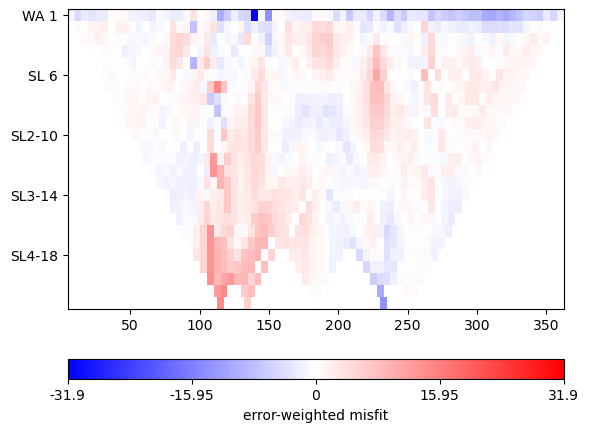

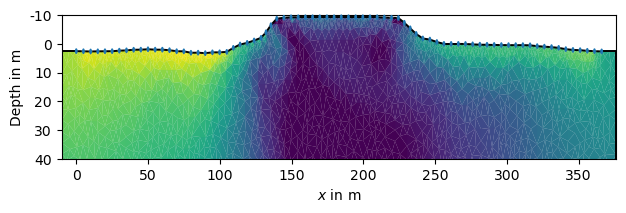

In [46]:
mgr.setMesh(mesh)

inv = mgr.invert(lam=20, verbose=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

24/10/25 - 11:11:06 - pyGIMLi - INFO - Found 4 regions.
24/10/25 - 11:11:06 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
24/10/25 - 11:11:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
24/10/25 - 11:11:08 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
24/10/25 - 11:11:08 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
24/10/25 - 11:11:10 - pyGIMLi - INFO - Use median(data values)=587.9723573057448
24/10/25 - 11:11:10 - pyGIMLi - INFO - Created startmodel from forward operator:4999, min/max=587.972357/587.972357
24/10/25 - 11:11:10 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014D6AC083B0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/4.99%
min/max (start model): 588/588
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3973.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  638.16 (dPhi = 83.87%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  102.65 (dPhi = 80.81%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   17.92 (dPhi = 73.69%) lam: 20.0
---------

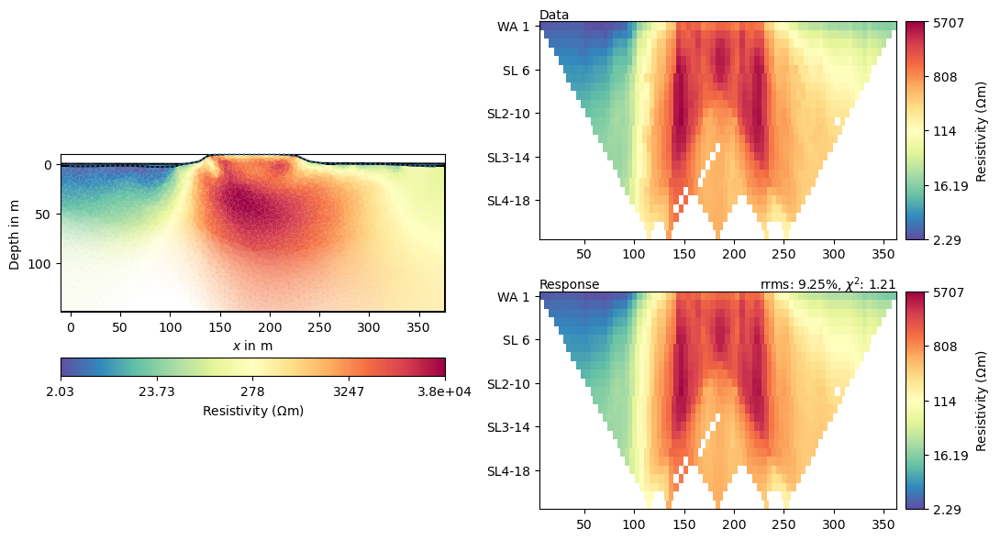

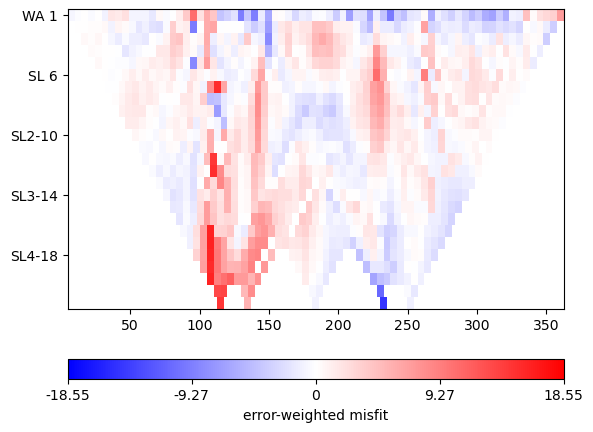

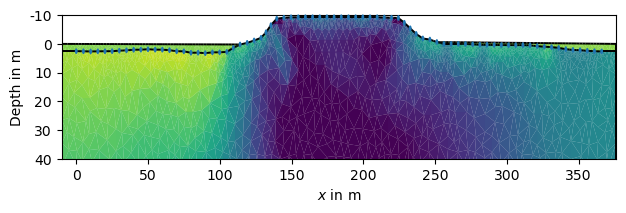

In [50]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(limits=[0, 0], trans="log")
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

24/10/25 - 09:16:52 - pyGIMLi - INFO - Found 4 regions.
24/10/25 - 09:16:52 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
24/10/25 - 09:16:52 - pyGIMLi - INFO - Creating forward mesh from region infos.
24/10/25 - 09:16:54 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
24/10/25 - 09:16:56 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 18247 Cells: 35912 Boundaries: 27224
24/10/25 - 09:16:58 - pyGIMLi - INFO - Use median(data values)=587.9725194823121
24/10/25 - 09:16:58 - pyGIMLi - INFO - Created startmodel from forward operator:7907, min/max=587.972519/587.972519
24/10/25 - 09:16:58 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000014D6AC083B0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/4.99%
min/max (start model): 588/588
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3973.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  610.85 (dPhi = 84.50%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  172.33 (dPhi = 66.12%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   32.89 (dPhi = 72.45%) lam: 20.0
---------

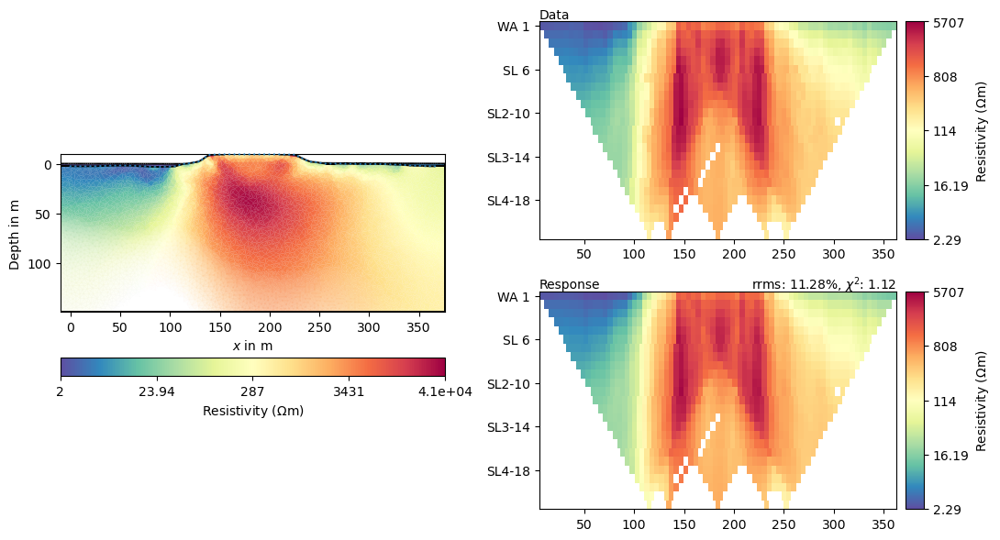

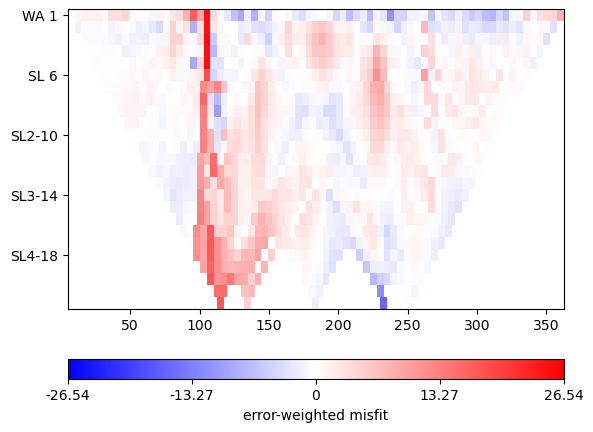

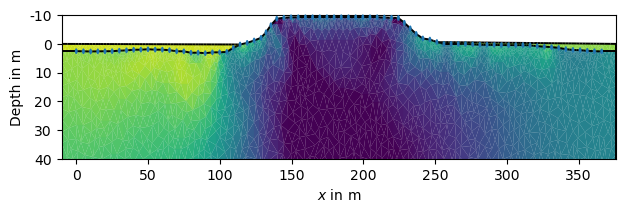

In [39]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 21:04:04 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 21:04:04 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 21:04:04 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 21:04:06 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 21:04:10 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 21:04:11 - pyGIMLi - INFO - Use median(data values)=587.9722541759678
23/10/25 - 21:04:11 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=587.972254/587.972254
23/10/25 - 21:04:11 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B14FB422A0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/5.18%
min/max (start model): 588/588
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3466.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  596.46 (dPhi = 82.72%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  145.84 (dPhi = 69.49%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   41.50 (dPhi = 66.18%) lam: 20.0
---------

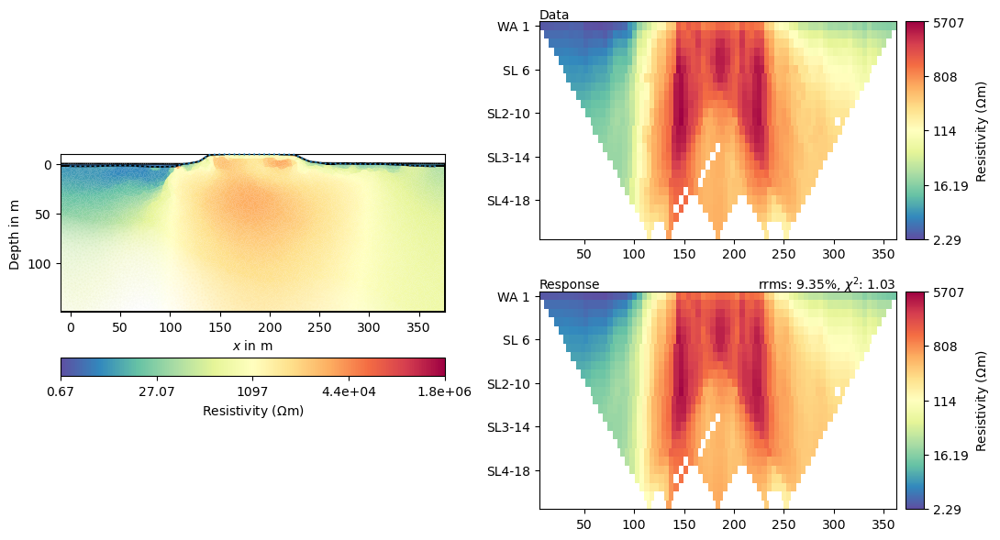

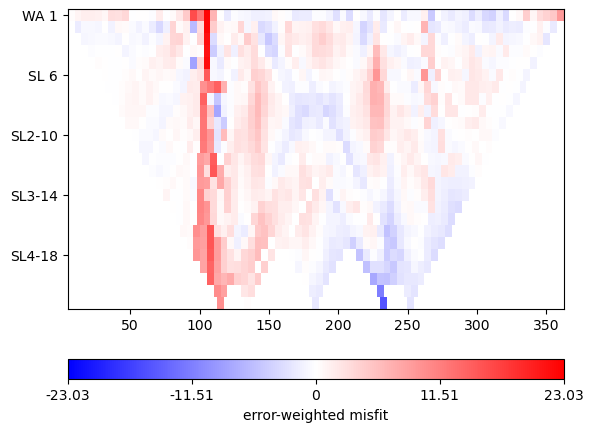

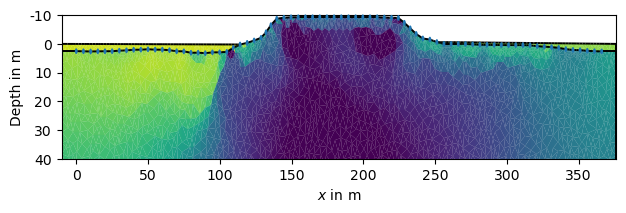

In [108]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 19:55:43 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 19:55:43 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 19:55:45 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 19:55:46 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 19:55:50 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 19:55:53 - pyGIMLi - INFO - Use median(data values)=561.792169173182
23/10/25 - 19:55:53 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=561.792169/561.792169
23/10/25 - 19:55:53 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B0D3B23060>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/4.98%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3528.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  965.36 (dPhi = 72.61%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  319.53 (dPhi = 53.34%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   57.95 (dPhi = 83.22%) lam: 20.0
---------

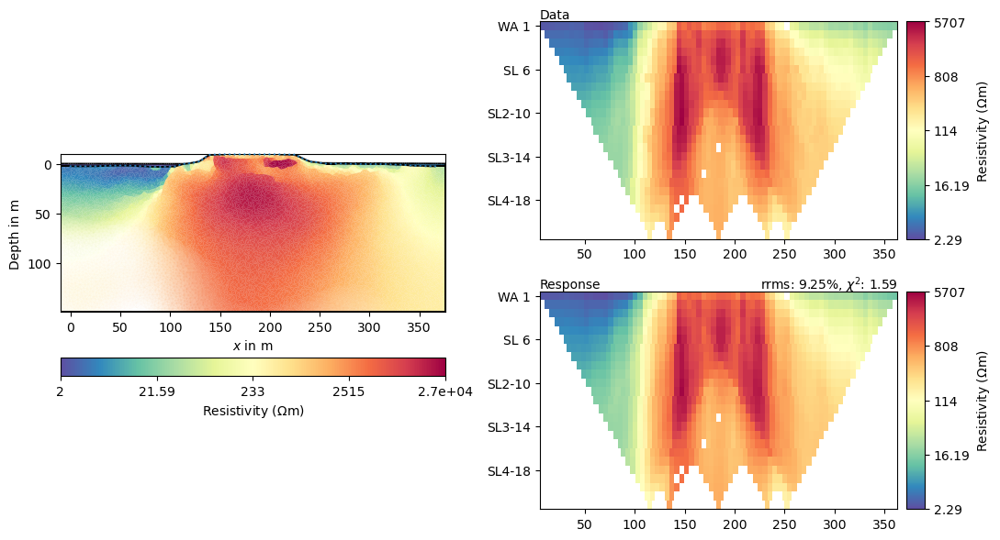

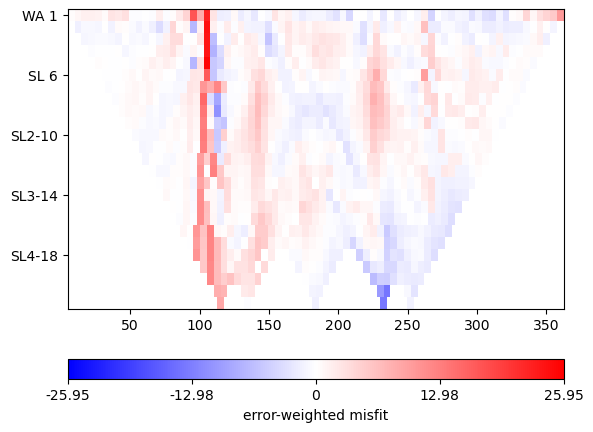

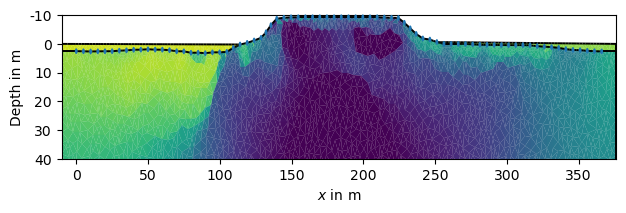

In [89]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 16:33:51 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 16:33:51 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 16:33:53 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 16:33:55 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 16:33:59 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 16:34:01 - pyGIMLi - INFO - Use median(data values)=561.792169173182
23/10/25 - 16:34:02 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=561.792169/561.792169
23/10/25 - 16:34:02 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B0D3B23060>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/4.98%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3528.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1442.95 (dPhi = 59.09%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  118.50 (dPhi = 91.26%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   48.55 (dPhi = 43.10%) lam: 20.0
---------

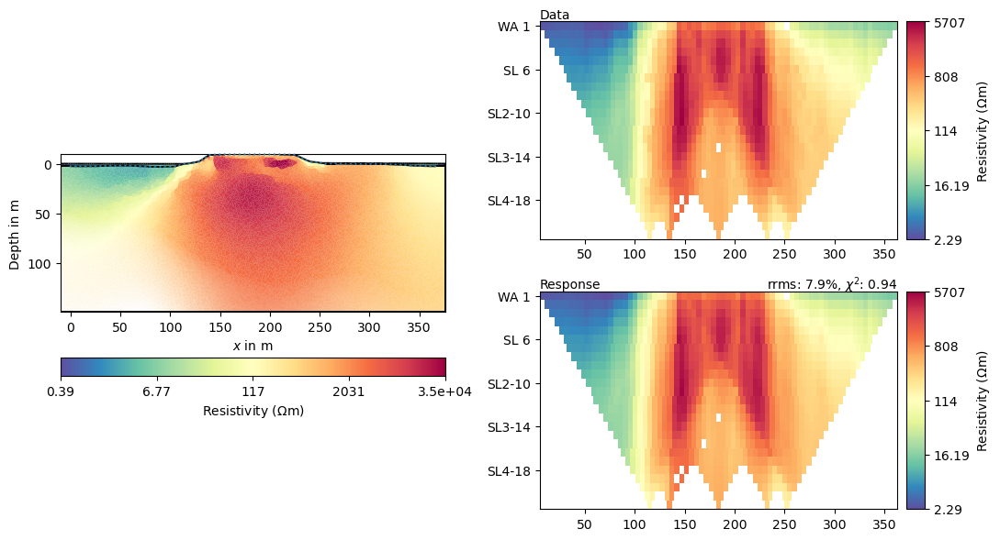

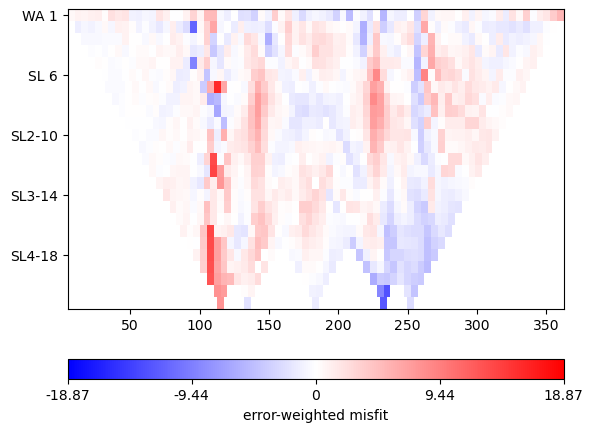

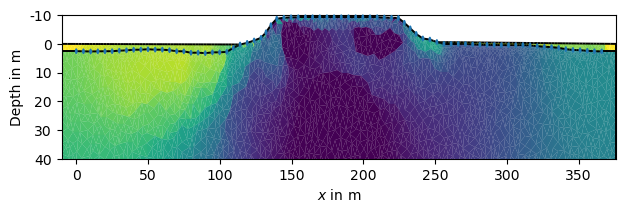

In [88]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 0], trans="log")
mgr.inv.setRegularization(4, limits=[0, 0], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 14:47:45 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 14:47:45 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 14:47:46 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 14:47:47 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 14:47:51 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 14:47:54 - pyGIMLi - INFO - Use median(data values)=561.792169173182
23/10/25 - 14:47:54 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=561.792169/561.792169
23/10/25 - 14:47:54 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B0D3B23060>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/4.98%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3528.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1049.60 (dPhi = 70.22%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   83.69 (dPhi = 91.30%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   37.00 (dPhi = 36.99%) lam: 20.0
---------

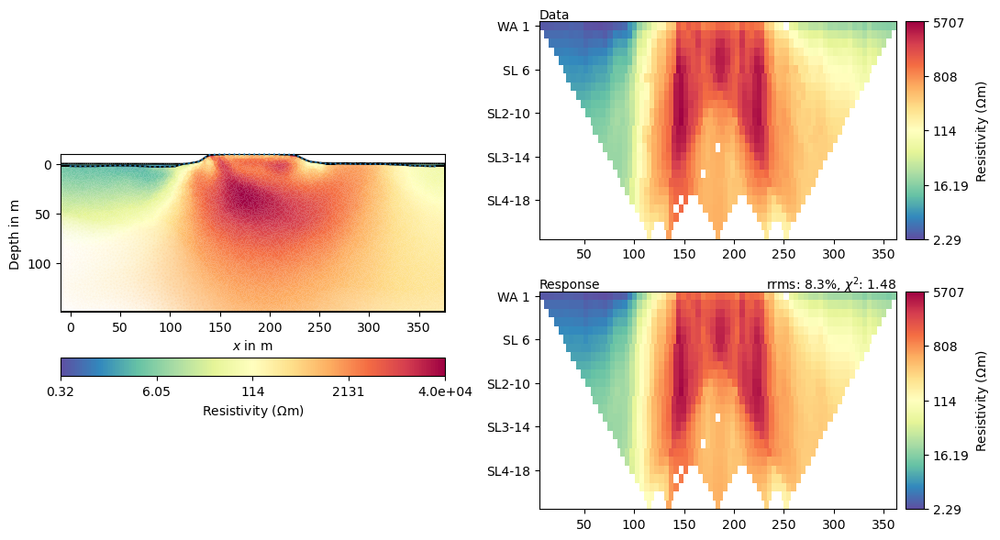

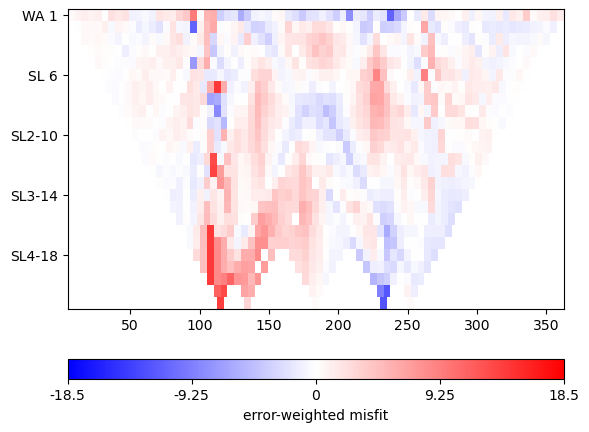

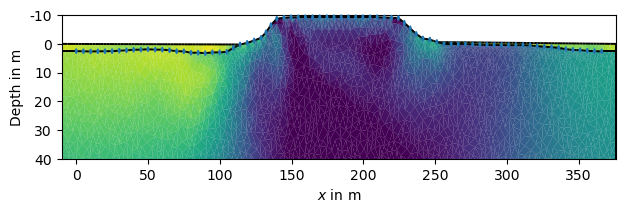

In [79]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 0], trans="log")
mgr.inv.setRegularization(4, limits=[0, 0], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 13:58:24 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 13:58:24 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 13:58:24 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 13:58:25 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 13:58:28 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 13:58:30 - pyGIMLi - INFO - Use median(data values)=561.792169173182
23/10/25 - 13:58:30 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=561.792169/561.792169
23/10/25 - 13:58:30 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B0D3B23060>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/4.98%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3528.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  588.44 (dPhi = 83.18%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  175.00 (dPhi = 63.75%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   34.75 (dPhi = 71.93%) lam: 20.0
---------

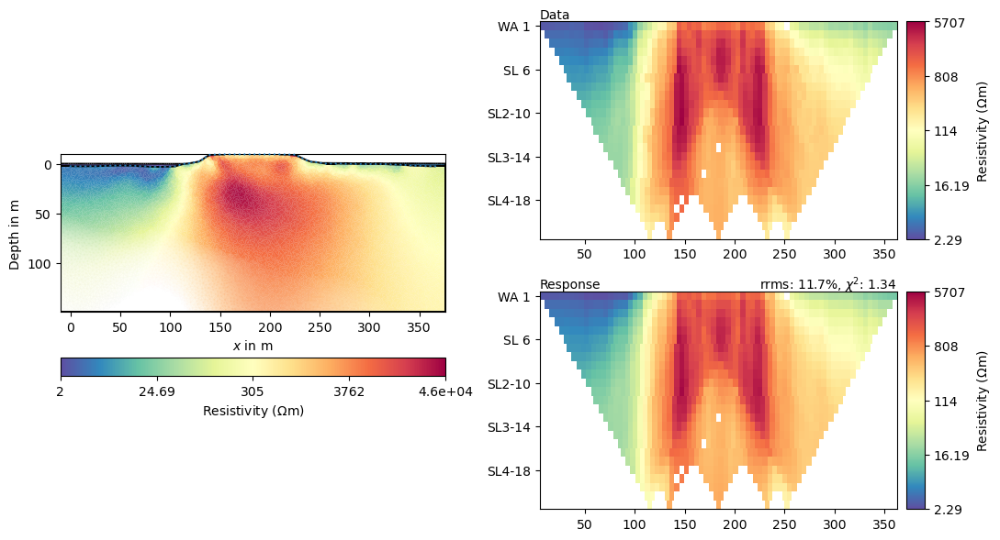

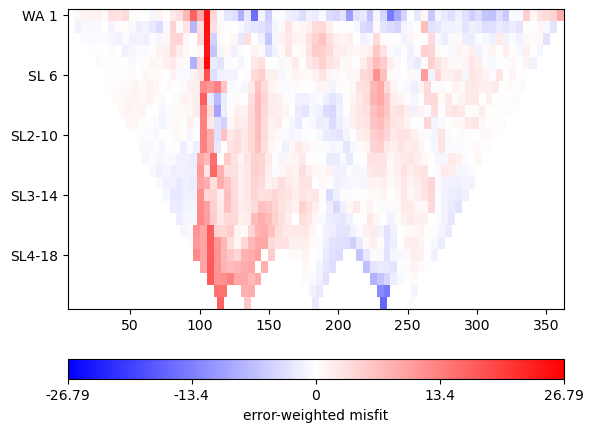

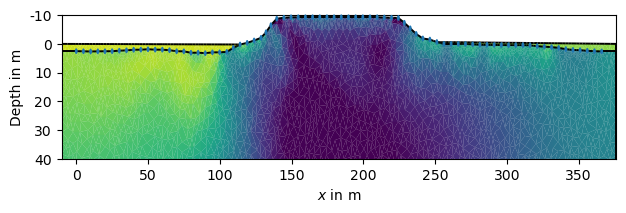

In [76]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 13:09:00 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 13:09:00 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 13:09:01 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 13:09:02 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 13:09:04 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 13:09:08 - pyGIMLi - INFO - Use median(data values)=561.792169173182
23/10/25 - 13:09:08 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=561.792169/561.792169
23/10/25 - 13:09:08 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B0D0C3D4E0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  296.82 (dPhi = 86.32%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   61.43 (dPhi = 66.32%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.36 (dPhi = 84.07%) lam: 20.0
----------

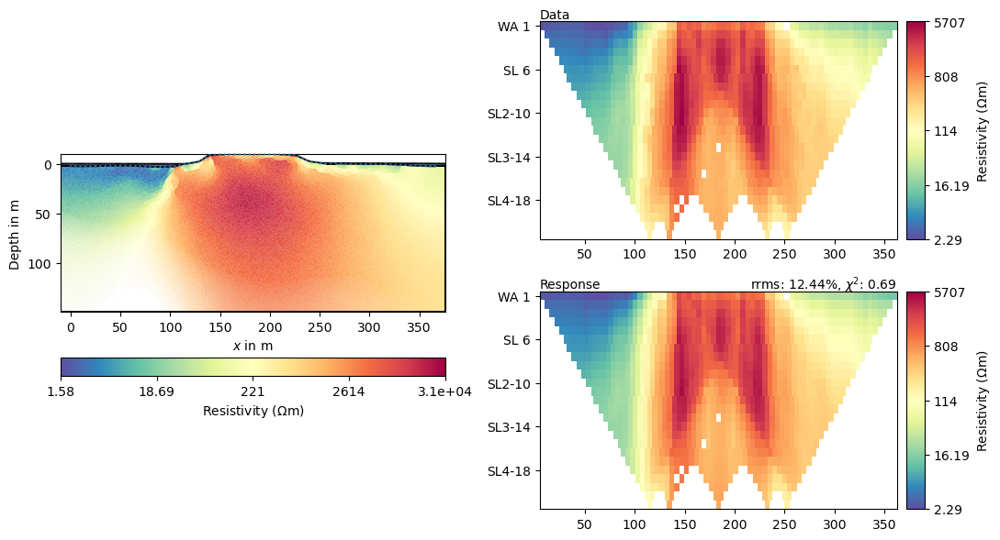

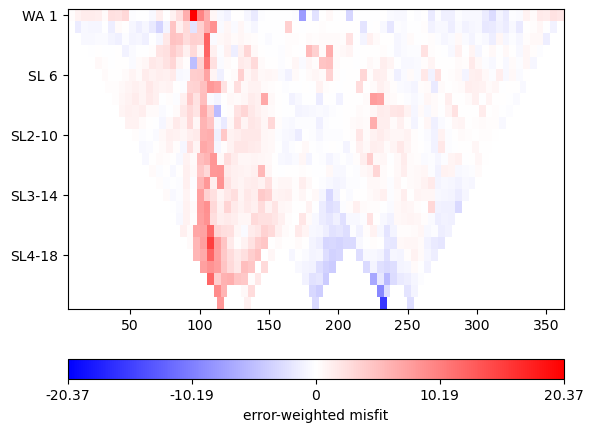

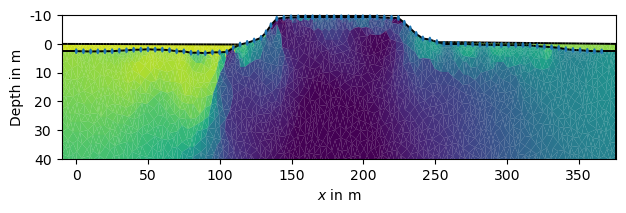

In [58]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 12:26:54 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 12:26:54 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 12:26:56 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 12:26:58 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 12:27:01 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 12:27:04 - pyGIMLi - INFO - Use median(data values)=561.792169173182
23/10/25 - 12:27:04 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=561.792169/561.792169
23/10/25 - 12:27:04 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B0D0C3D4E0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  285.06 (dPhi = 86.89%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.39 (dPhi = 88.66%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.96 (dPhi = 80.19%) lam: 20.0
----------

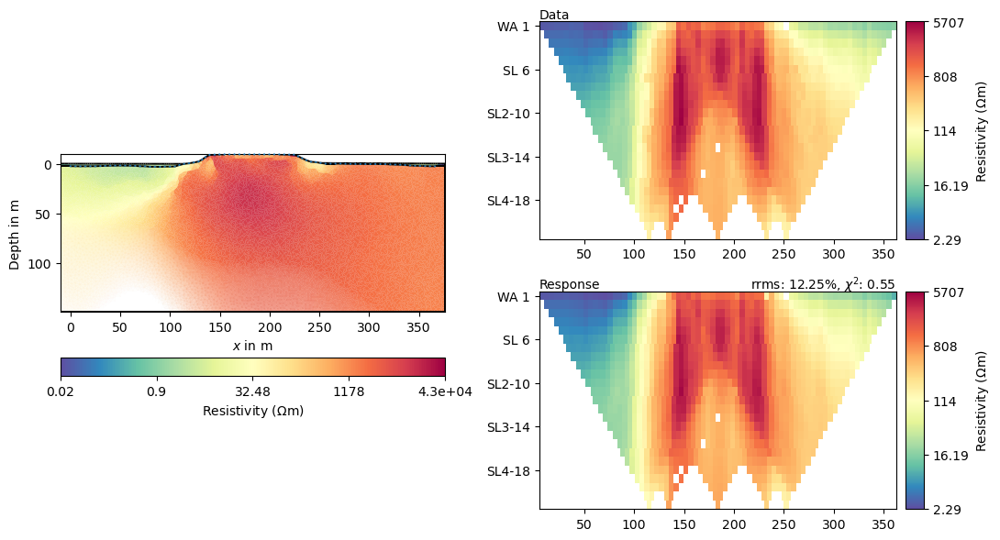

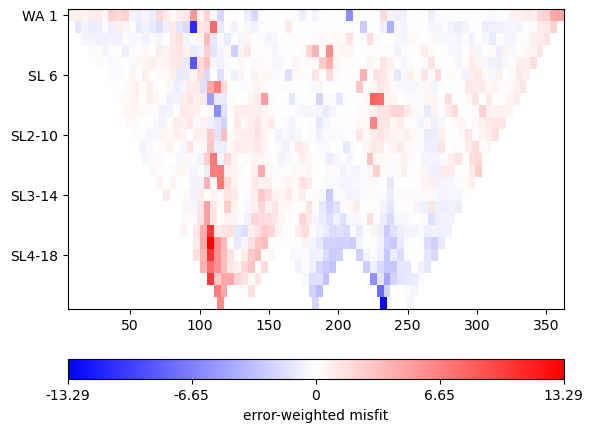

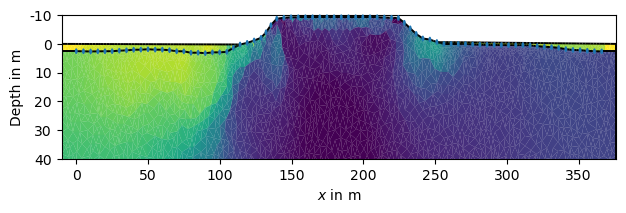

In [54]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 0], trans="log")
mgr.inv.setRegularization(4, limits=[0, 0], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 11:07:35 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 11:07:35 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 11:07:36 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 11:07:38 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 11:07:41 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 11:07:45 - pyGIMLi - INFO - Use median(data values)=561.792169173182
23/10/25 - 11:07:45 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=561.792169/561.792169
23/10/25 - 11:07:45 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B0D0C3D4E0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  321.22 (dPhi = 85.21%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  123.55 (dPhi = 61.45%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   29.12 (dPhi = 75.69%) lam: 20.0
----------

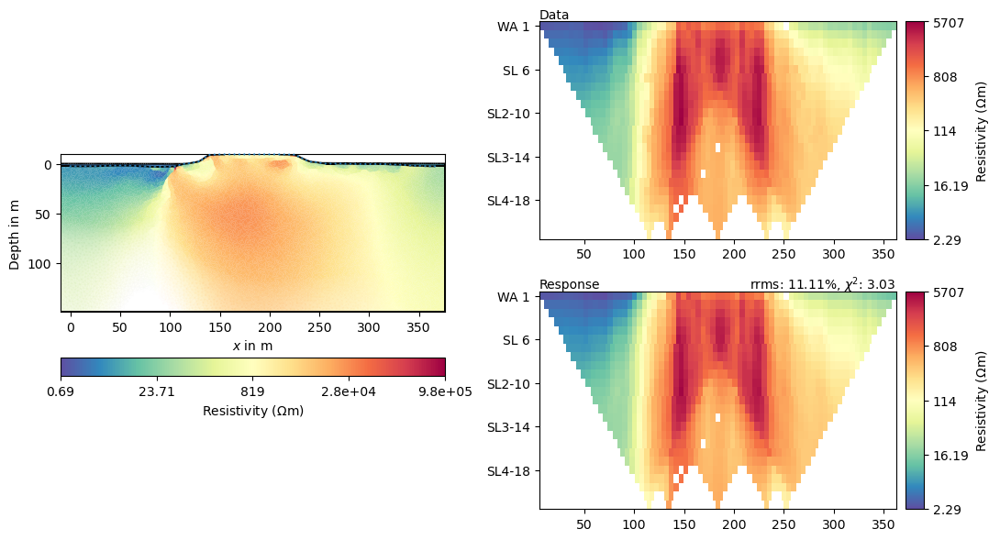

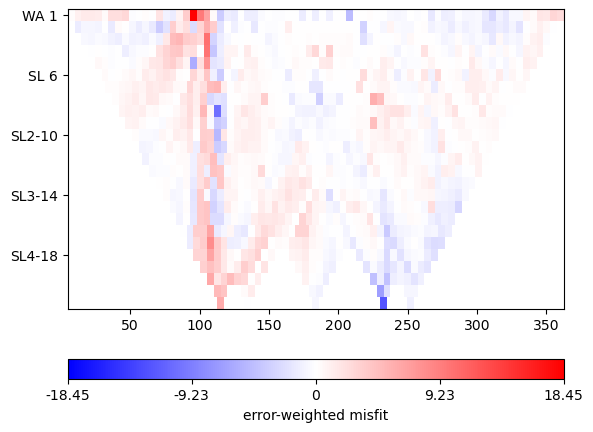

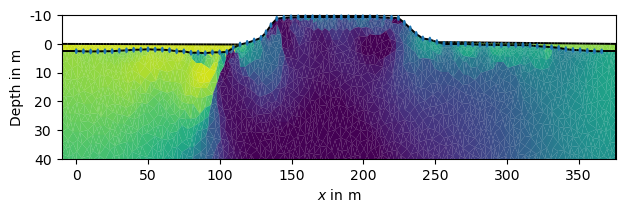

In [53]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

23/10/25 - 09:54:07 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 09:54:07 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 09:54:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 09:54:09 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 09:54:11 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 24845 Cells: 49104 Boundaries: 37120
23/10/25 - 09:54:12 - pyGIMLi - INFO - Use median(data values)=561.792169173182
23/10/25 - 09:54:12 - pyGIMLi - INFO - Created startmodel from forward operator:10906, min/max=561.792169/561.792169
23/10/25 - 09:54:12 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B0D0C3D4E0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  306.28 (dPhi = 85.93%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   52.03 (dPhi = 82.85%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.60 (dPhi = 86.25%) lam: 20.0
----------

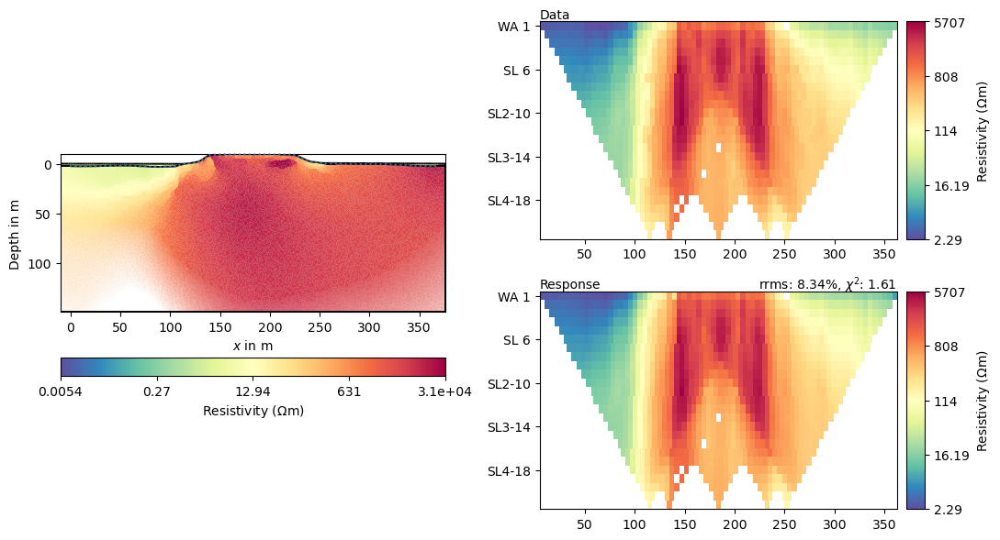

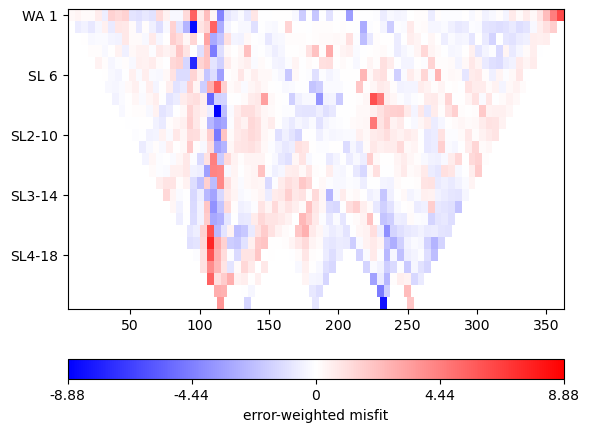

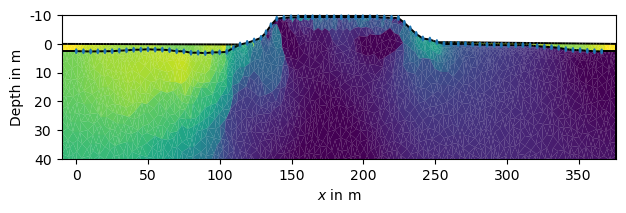

In [43]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 0], trans="log")
mgr.inv.setRegularization(4, limits=[0, 0], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

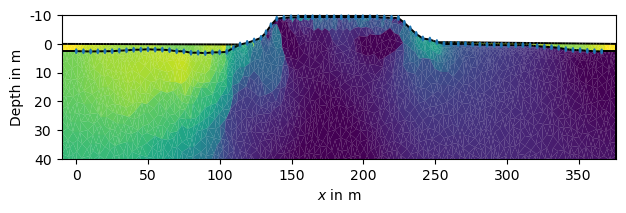

In [52]:
ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False, showMesh=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

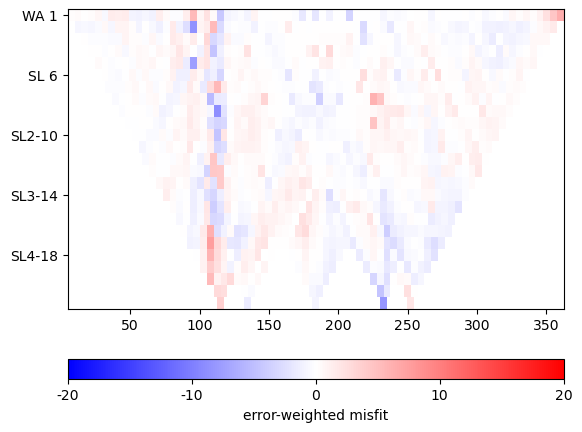

In [51]:
mgr.showMisfit(errorWeighted=True, cMax=20)

23/10/25 - 09:16:23 - pyGIMLi - INFO - Found 4 regions.
23/10/25 - 09:16:23 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
23/10/25 - 09:16:23 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/25 - 09:16:24 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
23/10/25 - 09:16:25 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
23/10/25 - 09:16:27 - pyGIMLi - INFO - Use median(data values)=561.7923300256455
23/10/25 - 09:16:27 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=561.792330/561.792330
23/10/25 - 09:16:27 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001B02B11B470>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  273.45 (dPhi = 87.43%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.49 (dPhi = 86.45%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.88 (dPhi = 82.31%) lam: 20.0
----------

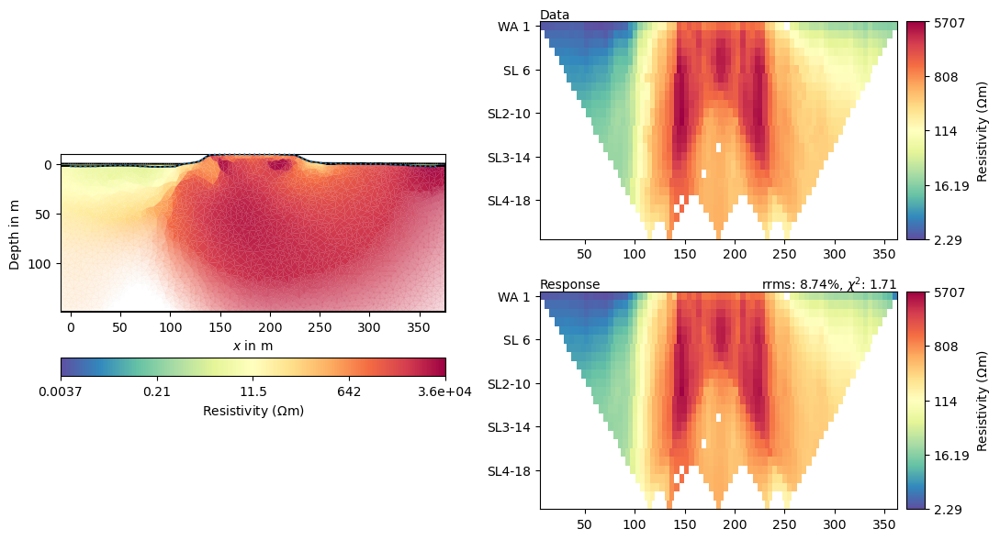

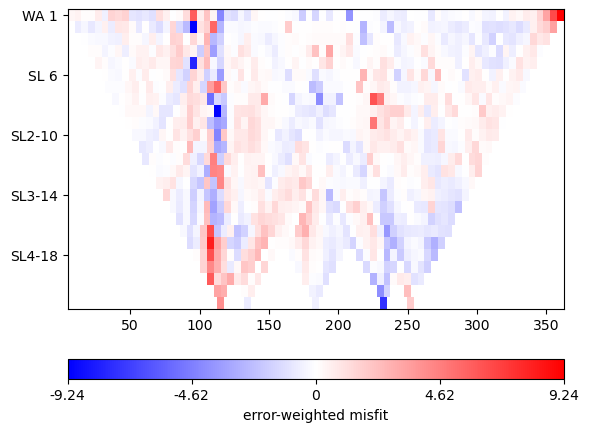

In [19]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 0], trans="log")
mgr.inv.setRegularization(4, limits=[0, 0], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

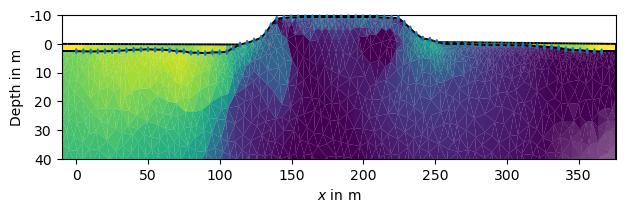

In [28]:
ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

16/10/25 - 16:40:33 - pyGIMLi - INFO - Found 4 regions.
16/10/25 - 16:40:33 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 16:40:33 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 16:40:33 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 16:40:35 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
16/10/25 - 16:40:35 - pyGIMLi - INFO - Use median(data values)=561.7923300256455
16/10/25 - 16:40:35 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=561.792330/561.792330
16/10/25 - 16:40:35 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027AD86AFC40>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  273.45 (dPhi = 87.41%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   47.20 (dPhi = 82.47%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.38 (dPhi = 82.10%) lam: 20.0
----------

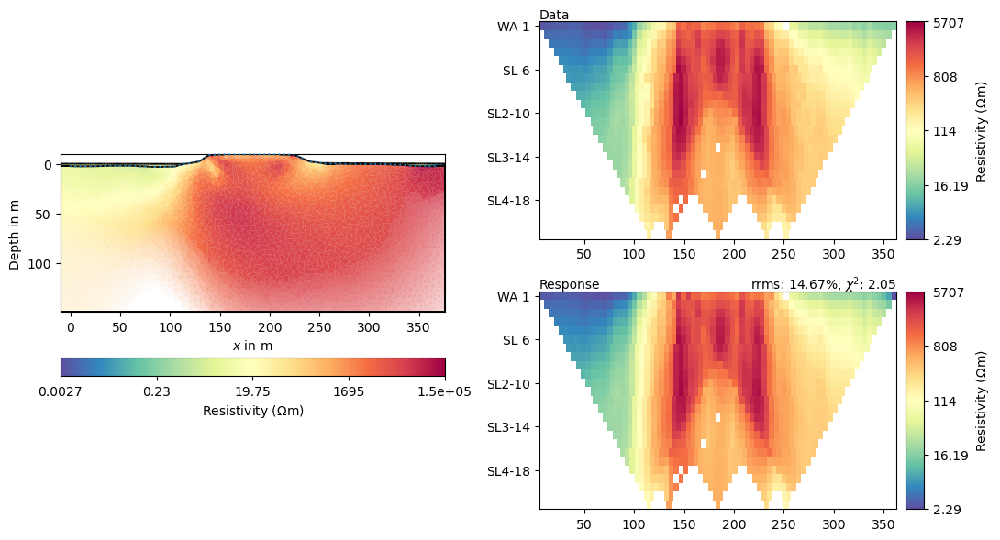

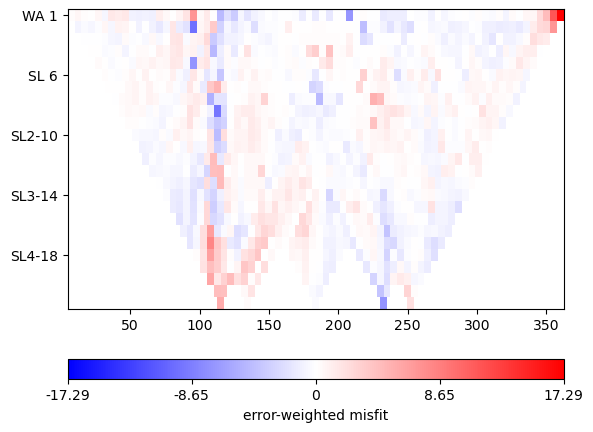

In [151]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 0], trans="log")
mgr.inv.setRegularization(4, limits=[0, 0], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

16/10/25 - 16:15:53 - pyGIMLi - INFO - Found 4 regions.
16/10/25 - 16:15:53 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 16:15:53 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 16:15:54 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 16:15:54 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
16/10/25 - 16:15:55 - pyGIMLi - INFO - Use median(data values)=561.7923300256455
16/10/25 - 16:15:55 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=561.792330/561.792330
16/10/25 - 16:15:55 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027AD81212B0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/4.98%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3528.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1116.76 (dPhi = 68.32%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   97.57 (dPhi = 91.04%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   54.54 (dPhi = 43.52%) lam: 20.0
---------

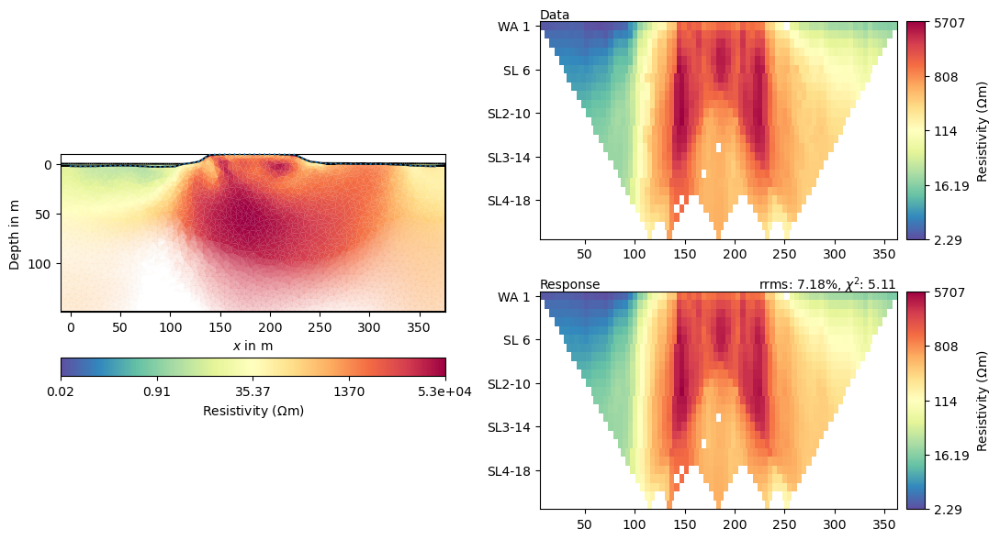

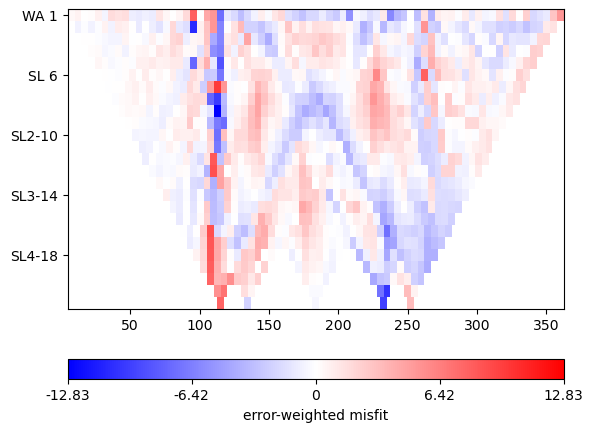

In [129]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 0], trans="log")
mgr.inv.setRegularization(4, limits=[0, 0], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

16/10/25 - 14:07:16 - pyGIMLi - INFO - Found 4 regions.
16/10/25 - 14:07:16 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 14:07:16 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 14:07:16 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 14:07:17 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
16/10/25 - 14:07:18 - pyGIMLi - INFO - Use median(data values)=561.7923300256455
16/10/25 - 14:07:18 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=561.792330/561.792330
16/10/25 - 14:07:18 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027AD57FA5C0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  145.93 (dPhi = 93.19%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   39.09 (dPhi = 72.86%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   11.97 (dPhi = 66.35%) lam: 20.0
----------

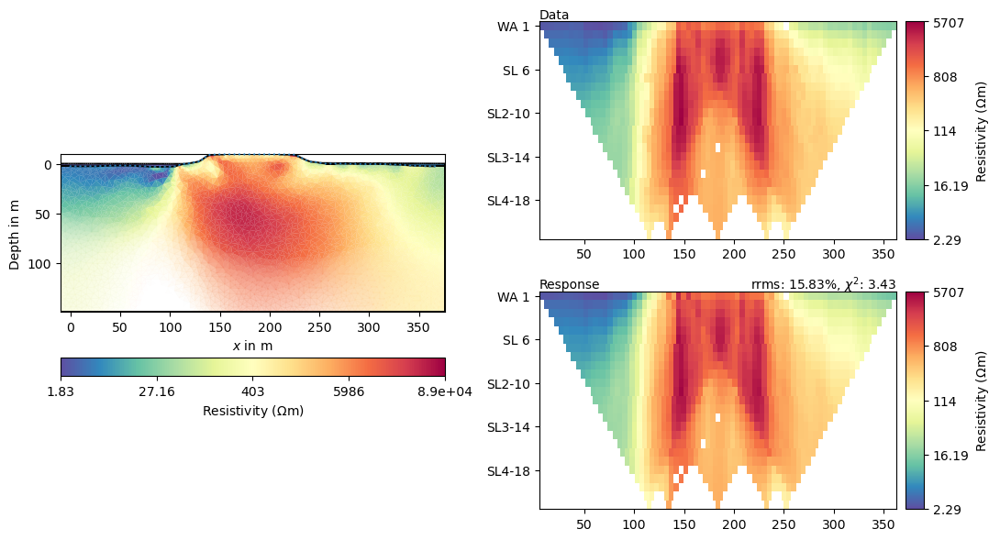

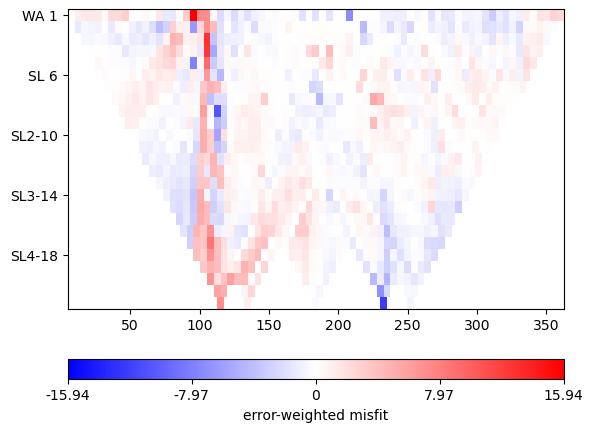

In [90]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log", zWeight=0.5)
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log", zWeight=0.5)
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x27ad4d5ed50>)

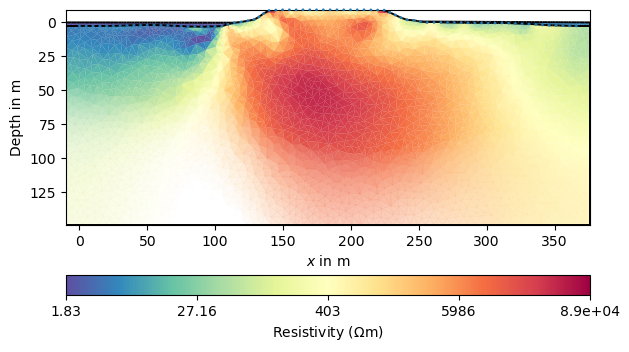

In [94]:
mgr.showResult()

16/10/25 - 13:38:43 - pyGIMLi - INFO - Found 4 regions.
16/10/25 - 13:38:43 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 13:38:44 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 13:38:44 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 13:38:45 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
16/10/25 - 13:38:46 - pyGIMLi - INFO - Use median(data values)=561.7923300256455
16/10/25 - 13:38:46 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=561.792330/561.792330
16/10/25 - 13:38:46 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027AD57FA5C0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  274.01 (dPhi = 87.38%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   46.59 (dPhi = 82.72%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.74 (dPhi = 81.11%) lam: 20.0
----------

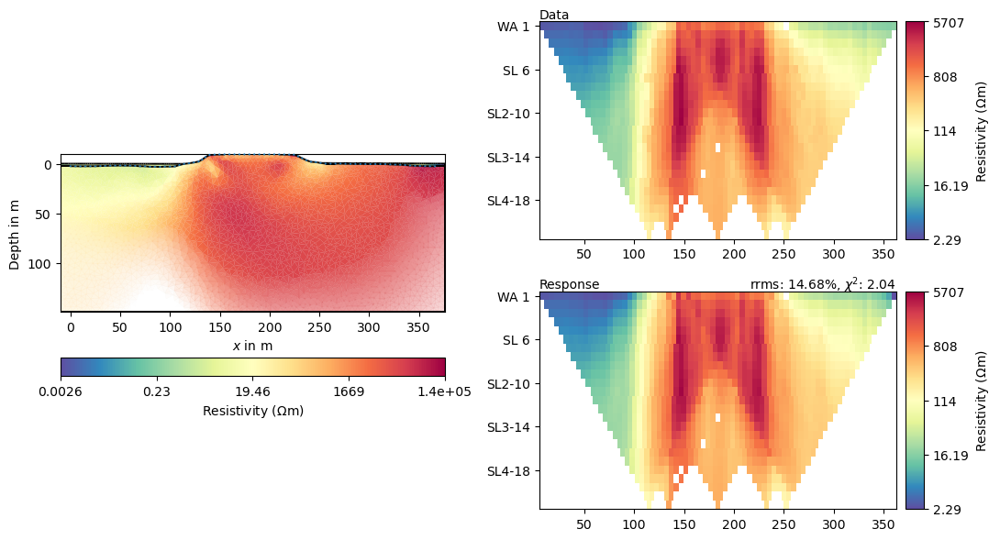

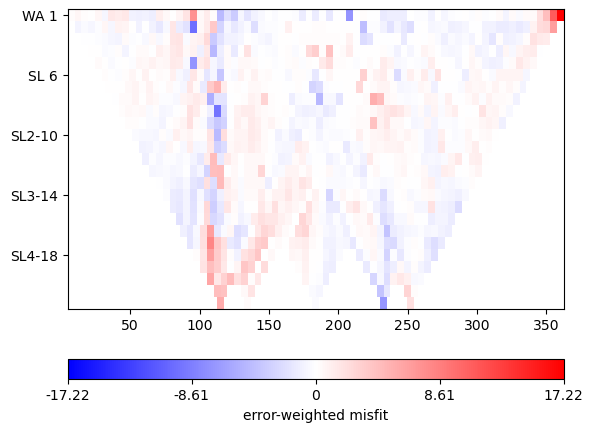

In [85]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, zWeight=0.9)
mgr.inv.setRegularization(4, zWeight=0.9)
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

16/10/25 - 13:11:52 - pyGIMLi - INFO - Found 4 regions.
16/10/25 - 13:11:52 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 13:11:52 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 13:11:52 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 13:11:53 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
16/10/25 - 13:11:53 - pyGIMLi - INFO - Use median(data values)=561.7923300256455
16/10/25 - 13:11:54 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=561.792330/561.792330
16/10/25 - 13:11:54 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027AD57FA5C0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  273.45 (dPhi = 87.41%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   47.00 (dPhi = 82.54%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.39 (dPhi = 82.00%) lam: 20.0
----------

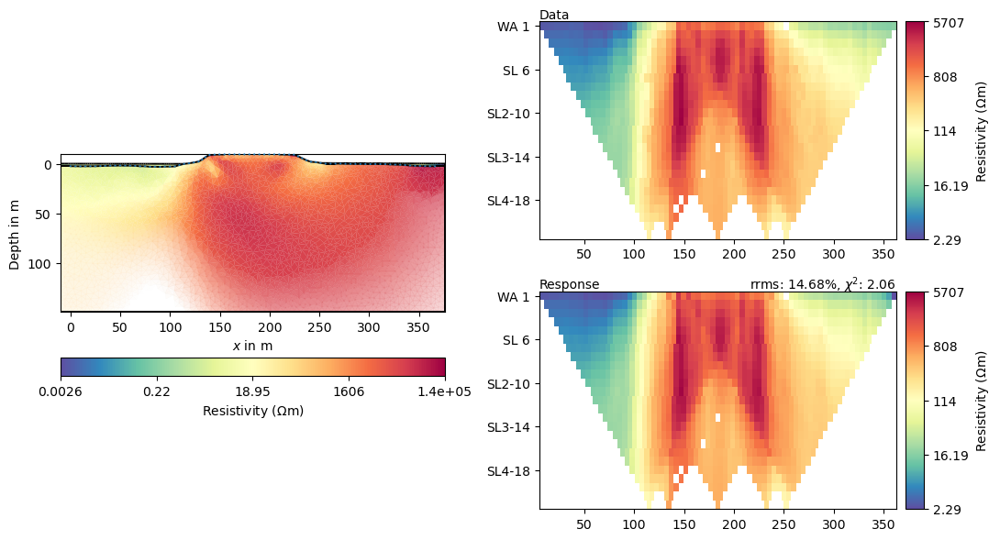

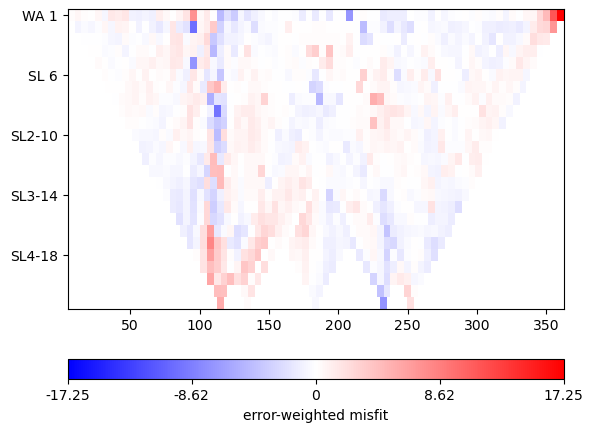

In [80]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, trans="log")
mgr.inv.setRegularization(4, trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x27a4bdada10>)

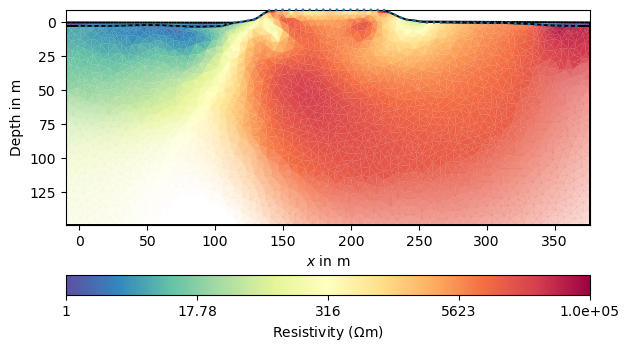

In [89]:
mgr.showResult(cMin=1, cMax=100000)

In [51]:
water = mesh.createSubMesh(mesh.cells(mesh.cellMarkers() == 3))
resWater = mgr.fw.model[len(mgr.model)-water.cellCount():]
ax, cb = pg.show(water, resWater)

: 

16/10/25 - 11:39:39 - pyGIMLi - INFO - Found 4 regions.
16/10/25 - 11:39:39 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 11:39:39 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 11:39:40 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 11:39:40 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
16/10/25 - 11:39:41 - pyGIMLi - INFO - Use median(data values)=561.7923300256455
16/10/25 - 11:39:41 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=561.792330/561.792330
16/10/25 - 11:39:41 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027A4A97F420>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  178.47 (dPhi = 91.74%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.79 (dPhi = 74.05%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   18.94 (dPhi = 57.53%) lam: 20.0
----------

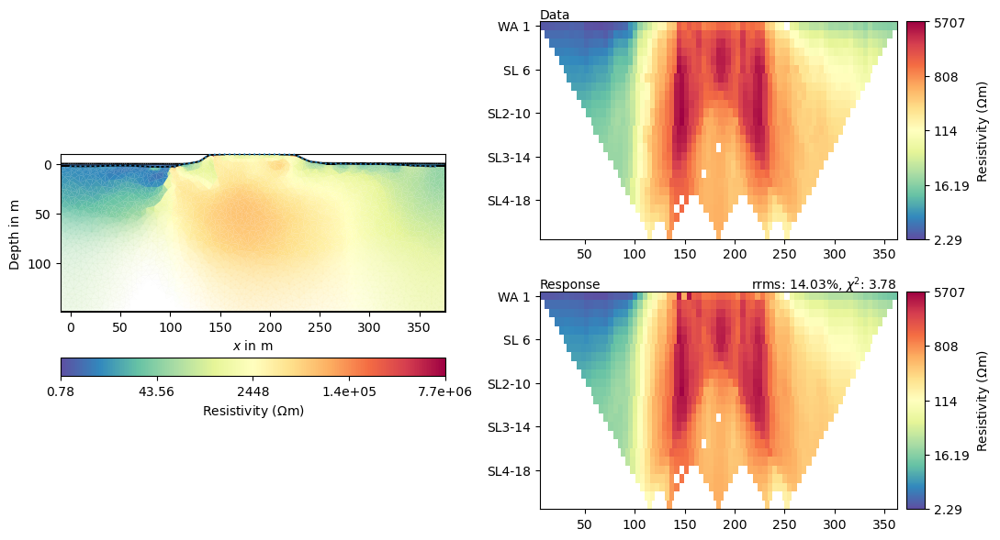

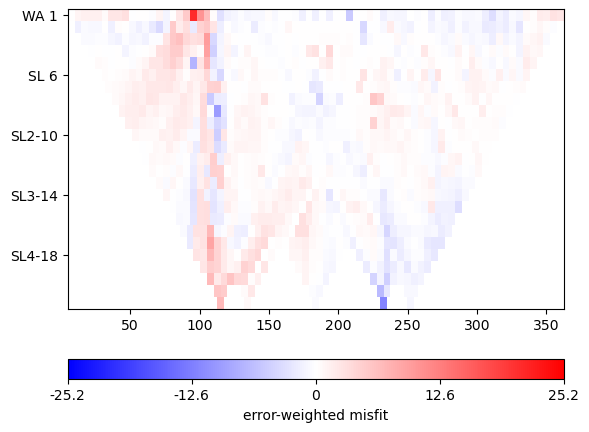

In [61]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

16/10/25 - 10:55:54 - pyGIMLi - INFO - Found 4 regions.
16/10/25 - 10:55:54 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 10:55:54 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 10:55:55 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 10:55:55 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
16/10/25 - 10:55:56 - pyGIMLi - INFO - Use median(data values)=561.7923300256455
16/10/25 - 10:55:56 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=561.792330/561.792330
16/10/25 - 10:55:56 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027A4A97F420>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/201%
min/max (start model): 562/562
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  145.93 (dPhi = 93.24%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.71 (dPhi = 73.26%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.17 (dPhi = 74.13%) lam: 20.0
----------

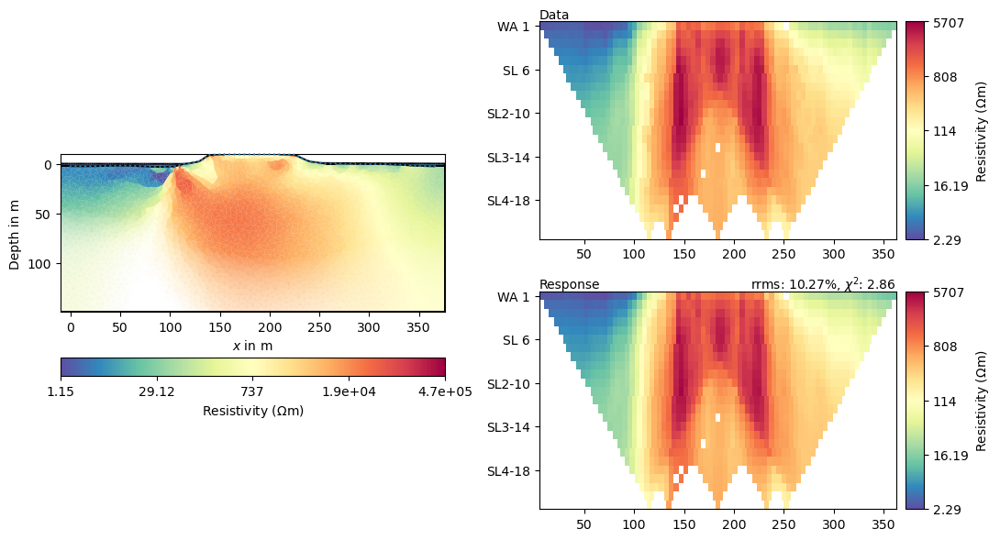

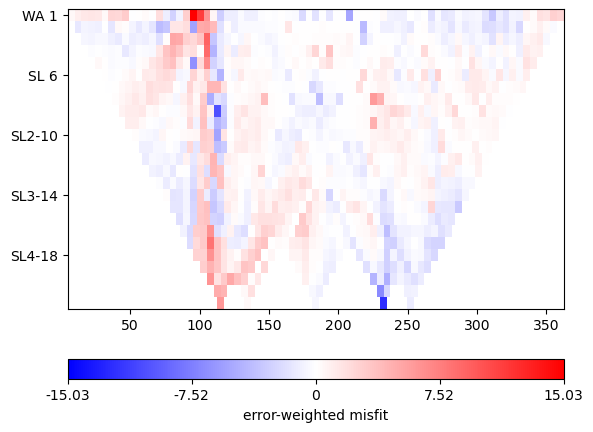

In [60]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

16/10/25 - 10:13:59 - pyGIMLi - INFO - Found 4 regions.
16/10/25 - 10:13:59 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
16/10/25 - 10:13:59 - pyGIMLi - INFO - Creating forward mesh from region infos.
16/10/25 - 10:14:00 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
16/10/25 - 10:14:00 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
16/10/25 - 10:14:01 - pyGIMLi - INFO - Use median(data values)=571.820564221233
16/10/25 - 10:14:01 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=571.820564/571.820564
16/10/25 - 10:14:01 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000027A42FFE160>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/32.32%
min/max (start model): 572/572
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2977.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  448.33 (dPhi = 84.86%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  172.88 (dPhi = 61.36%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   37.97 (dPhi = 77.31%) lam: 20.0
--------

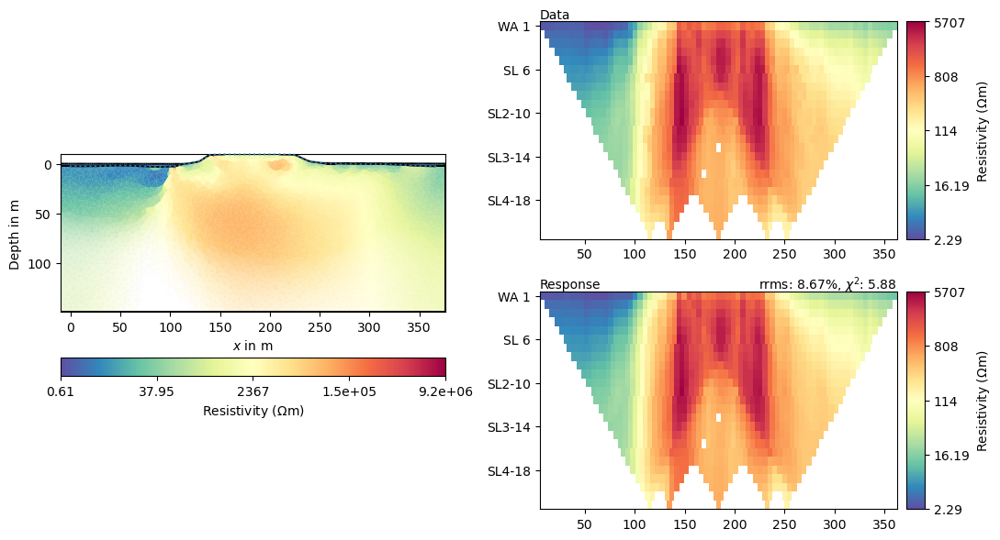

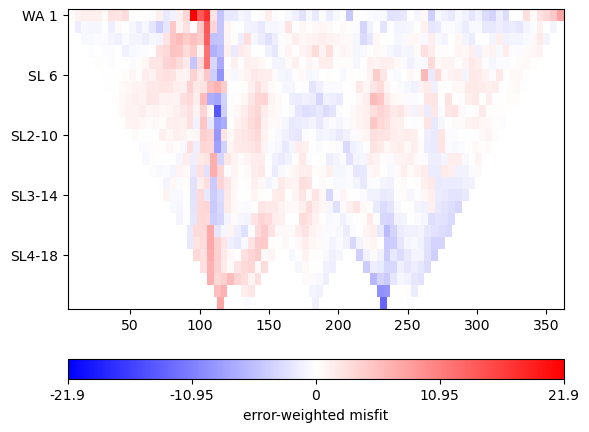

In [29]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.5)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x27a435b3690>)

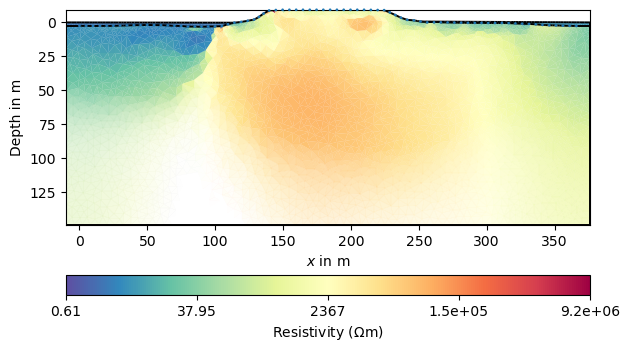

In [30]:
mgr.showResult()

15/10/25 - 16:45:48 - pyGIMLi - INFO - Found 4 regions.
15/10/25 - 16:45:48 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 16:45:48 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 16:45:48 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 16:45:49 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
15/10/25 - 16:45:49 - pyGIMLi - INFO - Use median(data values)=584.3220133286844
15/10/25 - 16:45:49 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=584.322013/584.322013
15/10/25 - 16:45:49 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001AA4D17ECF0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/32.91%
min/max (start model): 584/584
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2496.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  408.36 (dPhi = 83.55%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   99.48 (dPhi = 75.51%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   32.87 (dPhi = 65.88%) lam: 20.0
--------

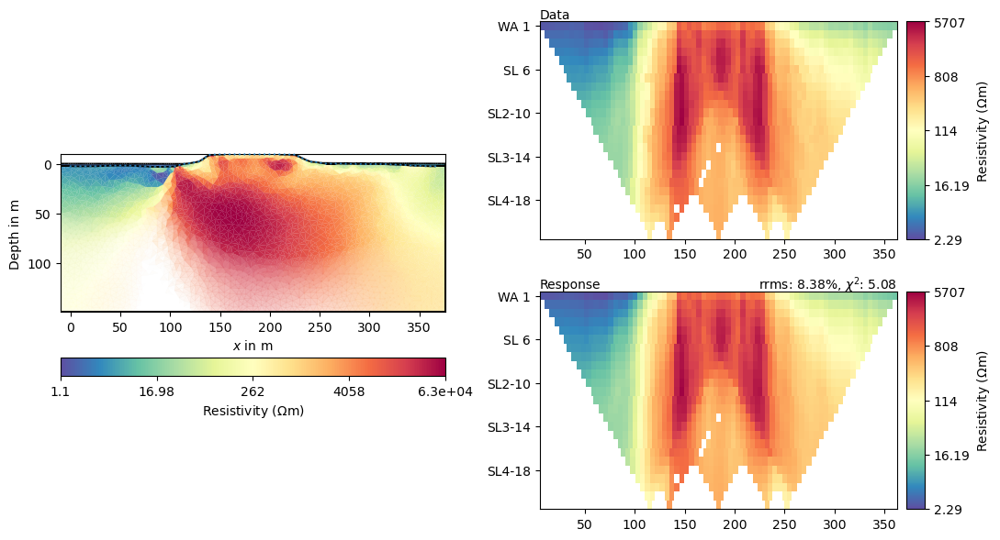

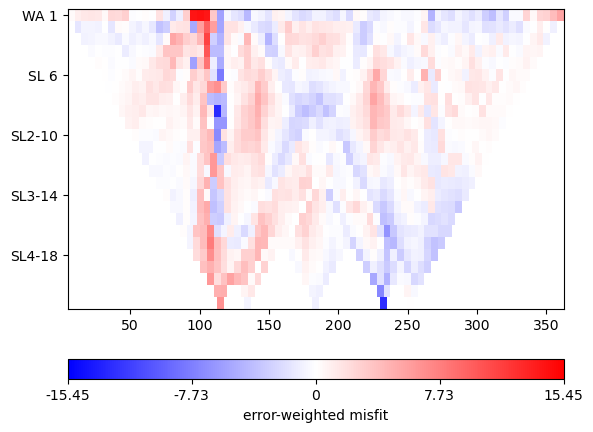

In [142]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
#mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

15/10/25 - 15:21:06 - pyGIMLi - INFO - Found 4 regions.
15/10/25 - 15:21:06 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 15:21:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 15:21:07 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 15:21:08 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
15/10/25 - 15:21:09 - pyGIMLi - INFO - Use median(data values)=584.3220133286844
15/10/25 - 15:21:09 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=584.322013/584.322013
15/10/25 - 15:21:09 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001A9CEAF7BF0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/302%
min/max (start model): 584/584
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  912.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  116.23 (dPhi = 87.13%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.10 (dPhi = 86.58%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.58 (dPhi = 65.64%) lam: 20.0
----------

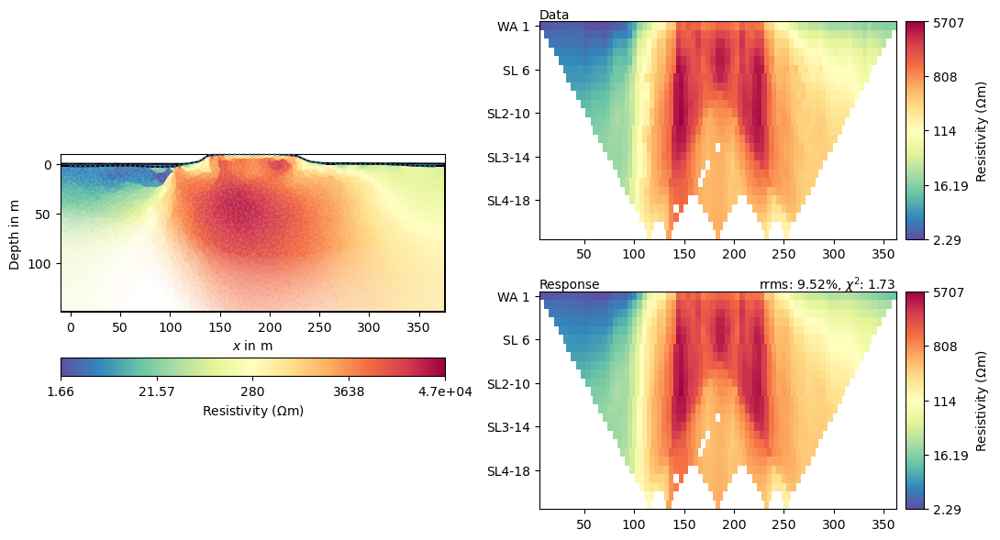

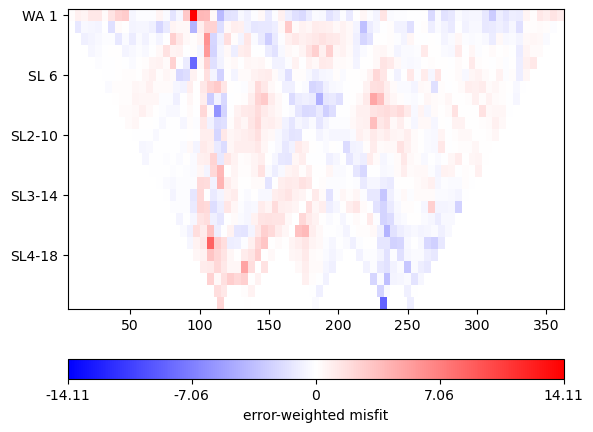

In [95]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
#mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

15/10/25 - 13:44:20 - pyGIMLi - INFO - Found 4 regions.
15/10/25 - 13:44:20 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 13:44:21 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 13:44:21 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 13:44:22 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
15/10/25 - 13:44:23 - pyGIMLi - INFO - Use median(data values)=584.3220133286844
15/10/25 - 13:44:23 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=584.322013/584.322013
15/10/25 - 13:44:23 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001A99AD089F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/6%
min/max (start model): 584/584
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3451.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  795.93 (dPhi = 76.89%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  221.82 (dPhi = 72.00%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   35.89 (dPhi = 83.08%) lam: 20.0
------------

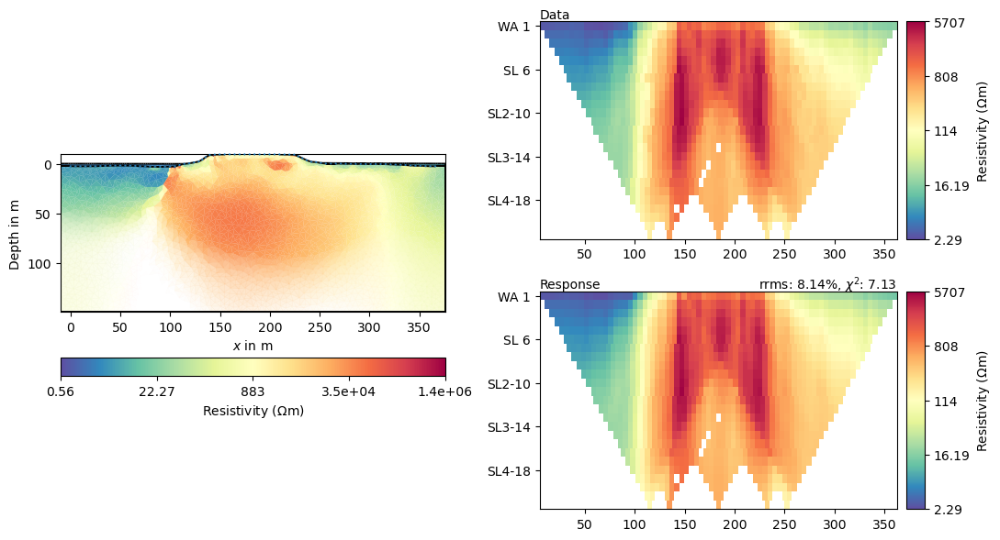

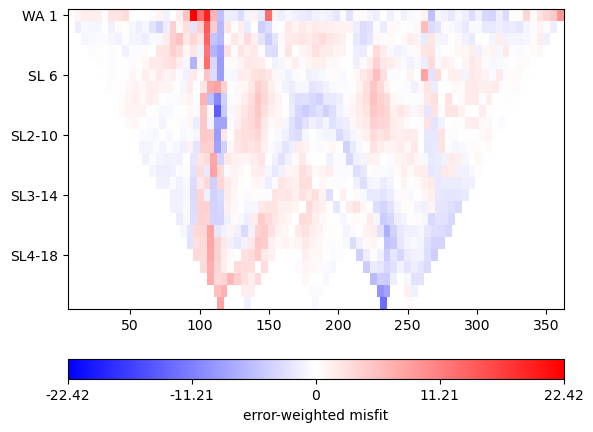

In [76]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
#mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

15/10/25 - 13:22:06 - pyGIMLi - INFO - Found 4 regions.
15/10/25 - 13:22:06 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 13:22:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 13:22:07 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 13:22:09 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
15/10/25 - 13:22:09 - pyGIMLi - INFO - Use median(data values)=584.3220133286844
15/10/25 - 13:22:09 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=584.322013/584.322013
15/10/25 - 13:22:09 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001A99AD089F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/6%
min/max (start model): 584/584
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3451.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  948.20 (dPhi = 72.48%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  286.64 (dPhi = 57.37%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   46.79 (dPhi = 85.31%) lam: 20.0
------------

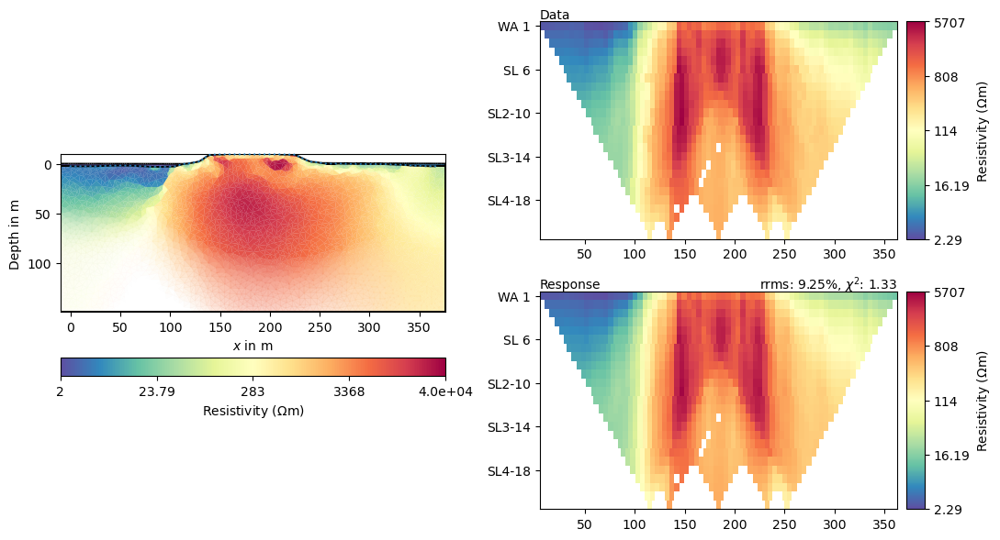

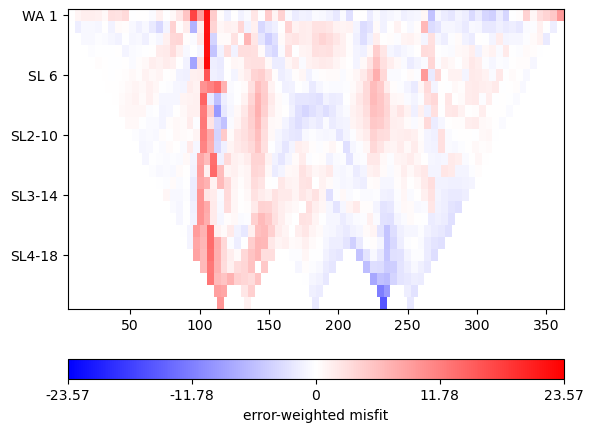

In [73]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x1a9cf627210>)

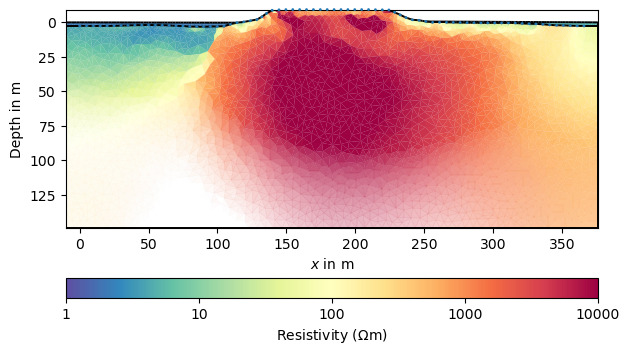

In [75]:
mgr.showResult(cMin=1, cMax=10000)

15/10/25 - 12:49:44 - pyGIMLi - INFO - Found 4 regions.
15/10/25 - 12:49:44 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
15/10/25 - 12:49:45 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/10/25 - 12:49:45 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
15/10/25 - 12:49:45 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 13070 Cells: 25556 Boundaries: 19458
15/10/25 - 12:49:46 - pyGIMLi - INFO - Use median(data values)=584.3220133286844
15/10/25 - 12:49:46 - pyGIMLi - INFO - Created startmodel from forward operator:5474, min/max=584.322013/584.322013
15/10/25 - 12:49:46 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001A99AD089F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 1.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 2.5, upper bound 5.0
min/max (data): 2.29/5707
min/max (error): 3%/6%
min/max (start model): 584/584
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3451.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  732.49 (dPhi = 78.70%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  203.85 (dPhi = 72.07%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   55.61 (dPhi = 71.99%) lam: 20.0
------------

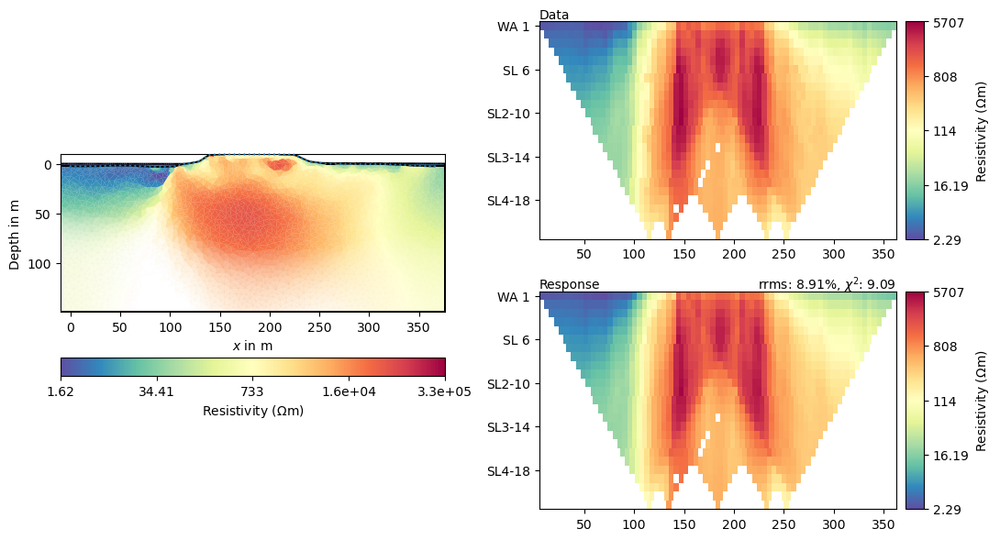

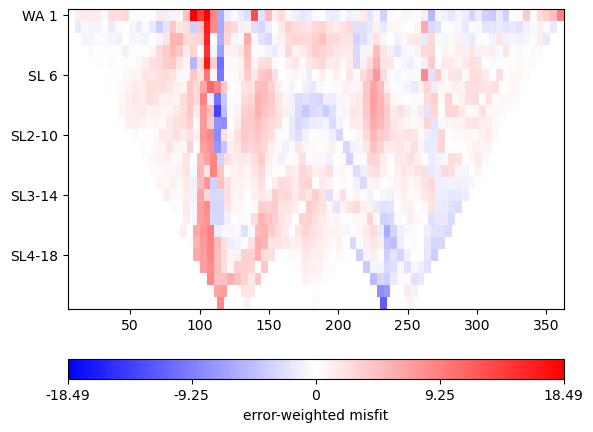

In [72]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
mgr.inv.setRegularization(2, zWeight=0.9)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

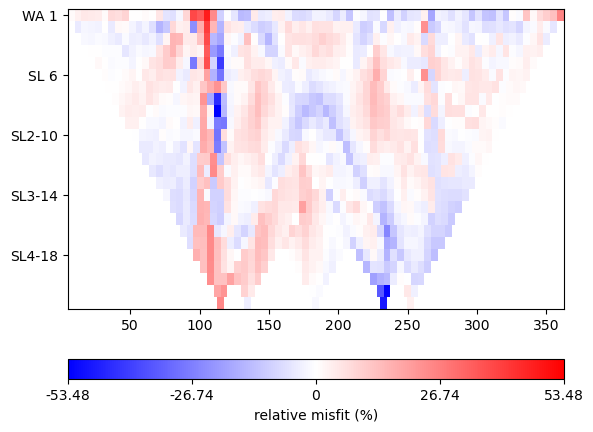

In [98]:
mgr.showMisfit()

In [1]:
mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r')

NameError: name 'mgr' is not defined

In [ ]:
def run_inv(referencemodel):
    # Set reference model as startmodel
    mgr.inv.inv.setModel(referencemodel)

    # Set reference model
    rm = mgr.inv.fop.regionManager()
    rm.setConstraintType(10) # 0 = reference model, 1 = first-order smoothing (default), 10 = both
    rm.fillConstraints(mgr.inv.fop.constraints())
    mgr.inv.inv.setReferenceModel(referencemodel)
    model = mgr.inv.inv.run()
    return model

def compute_DOI(ref1, ref2):
    m1 = run_inv(ref1)
    m2 = run_inv(ref2)

    R = (m1 - m2) / (m1r - m2r)
    return R


m1r = np.ones(mgr.paraDomain.cellCount()) * 10000
m2r = np.ones(mgr.paraDomain.cellCount()) * 50

DOI = compute_DOI(m1r, m2r)

fig, (ax1,ax2) = plt.subplots(2, 1, figsize=(10,7), dpi=150, sharex=True)

mgr.showResult(ax=ax1, orientation="vertical")
#ax1.set_xlabel("Profile length")
ax1.set_ylabel("y (m)")
pg.show(mgr.paraDomain, DOI, ax=ax2, cMin=0, cMax=1, orientation="vertical", label="DOI (-)")
ax2.set_xlabel("Profile length (m)")
ax2.set_ylabel("y (m)")

21/02/25 - 09:53:24 - pyGIMLi - INFO - Found 4 regions.
21/02/25 - 09:53:24 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
21/02/25 - 09:53:25 - pyGIMLi - INFO - Creating forward mesh from region infos.
21/02/25 - 09:53:26 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
21/02/25 - 09:53:26 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7183 Cells: 13800 Boundaries: 10632
21/02/25 - 09:53:27 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 09:53:27 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 09:53:27 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1EE0>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1E70>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C2B90>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.14 (dPhi = 89.30%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.25 (dPhi = 43.05%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.55 (dPhi = 4.46%) lam: 1000.0


21/02/25 - 10:00:45 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 10:00:45 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 10:00:45 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3370>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1AF0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.66 (dPhi = 89.91%) lam: 799.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.24 (dPhi = 47.05%) lam: 799.9
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.17 (dPhi = 5.35%) lam: 799.9
---

21/02/25 - 10:08:58 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 10:08:58 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 10:08:58 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1AF0>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C2340>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.96 (dPhi = 90.35%) lam: 639.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.51 (dPhi = 51.42%) lam: 639.9
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.01 (dPhi = 6.44%) lam: 639.9
---

21/02/25 - 10:18:12 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 10:18:12 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 10:18:12 - pyGIMLi - INFO - Starting inversion.


chi² =    6.68 (dPhi = 0.95%) lam: 639.9
################################################################################
#                Abort criterion reached: dPhi = 0.95 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1540>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.06 (dPhi = 90.70%) lam: 

21/02/25 - 10:25:51 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 10:25:51 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 10:25:51 - pyGIMLi - INFO - Starting inversion.


chi² =    5.73 (dPhi = 1.19%) lam: 511.9
################################################################################
#                Abort criterion reached: dPhi = 1.19 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.44 (dPhi = 90.94%) lam: 

21/02/25 - 10:32:23 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 10:32:23 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 10:32:23 - pyGIMLi - INFO - Starting inversion.


chi² =    5.16 (dPhi = 10.49%) lam: 409.5
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.94 (dPhi = 1.42%) lam: 409.5
################################################################################
#                Abort criterion reached: dPhi = 1.42 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1EE0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  4

21/02/25 - 10:39:22 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 10:39:22 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 10:39:22 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.96 (dPhi = 91.11%) lam: 262.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.59 (dPhi = 66.13%) lam: 262.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.89 (dPhi = 17.72%) lam: 262.0
--

21/02/25 - 10:47:05 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 10:47:05 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 10:47:05 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1690>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1540>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.06 (dPhi = 91.07%) lam: 209.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.67 (dPhi = 68.98%) lam: 209.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.43 (dPhi = 22.45%) lam: 209.6
--

21/02/25 - 10:54:30 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 10:54:30 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 10:54:30 - pyGIMLi - INFO - Starting inversion.


chi² =    3.19 (dPhi = 0.50%) lam: 209.6
################################################################################
#                 Abort criterion reached: dPhi = 0.5 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1EE0>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1AF0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C2B90>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.58 (dPhi = 90.93%) lam: 

21/02/25 - 11:02:45 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 11:02:45 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 11:02:45 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1540>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1EE0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1AF0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.96 (dPhi = 90.76%) lam: 134.1
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.82 (dPhi = 73.96%) lam: 134.1
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.81 (dPhi = 32.24%) lam: 134.1
--

21/02/25 - 11:09:09 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 11:09:09 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 11:09:09 - pyGIMLi - INFO - Starting inversion.


chi² =    2.65 (dPhi = 3.24%) lam: 134.1
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    2.54 (dPhi = 0.79%) lam: 134.1
################################################################################
#                Abort criterion reached: dPhi = 0.79 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1E70>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C2B90>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1690>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  44

21/02/25 - 11:15:51 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 11:15:51 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 11:15:51 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1E70>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.96 (dPhi = 90.31%) lam: 85.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.87 (dPhi = 77.80%) lam: 85.8
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.46 (dPhi = 41.11%) lam: 85.8
-----

21/02/25 - 11:24:29 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 11:24:29 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 11:24:29 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1AF0>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C2340>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C03C0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.57 (dPhi = 90.05%) lam: 68.7
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.71 (dPhi = 79.72%) lam: 68.7
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.33 (dPhi = 44.18%) lam: 68.7
-----

21/02/25 - 11:30:49 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 11:30:49 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 11:30:49 - pyGIMLi - INFO - Starting inversion.


chi² =    2.04 (dPhi = 6.21%) lam: 68.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    1.97 (dPhi = 1.40%) lam: 68.7
################################################################################
#                 Abort criterion reached: dPhi = 1.4 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3370>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x000002903A3747B0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x000002903A375BD0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.

21/02/25 - 11:37:26 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 11:37:26 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 11:37:26 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C03C0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1EE0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.31 (dPhi = 89.57%) lam: 43.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.51 (dPhi = 82.48%) lam: 43.9
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.22 (dPhi = 49.26%) lam: 43.9
-----

21/02/25 - 11:44:59 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 11:44:59 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 11:44:59 - pyGIMLi - INFO - Starting inversion.


chi² =    1.71 (dPhi = 1.80%) lam: 43.9
################################################################################
#                 Abort criterion reached: dPhi = 1.8 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3370>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x000002903A3747B0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.57 (dPhi = 89.34%) lam: 3

21/02/25 - 11:54:08 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 11:54:08 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 11:54:08 - pyGIMLi - INFO - Starting inversion.


chi² =    1.57 (dPhi = 0.67%) lam: 35.1
################################################################################
#                Abort criterion reached: dPhi = 0.67 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3370>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x000002903A3747B0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.68 (dPhi = 89.14%) lam: 2

21/02/25 - 12:04:11 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 12:04:11 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 12:04:11 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1AF0>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3370>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.74 (dPhi = 88.93%) lam: 22.5
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.28 (dPhi = 85.19%) lam: 22.5
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.23 (dPhi = 53.29%) lam: 22.5
-----

21/02/25 - 12:14:14 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 12:14:14 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 12:14:14 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3370>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1540>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.83 (dPhi = 88.72%) lam: 18.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.31 (dPhi = 85.71%) lam: 18.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.25 (dPhi = 54.42%) lam: 18.0
-----

21/02/25 - 12:23:05 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 12:23:05 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 12:23:05 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1EE0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C03C0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.01 (dPhi = 88.48%) lam: 14.4
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.60 (dPhi = 85.68%) lam: 14.4
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.34 (dPhi = 56.13%) lam: 14.4
-----

21/02/25 - 12:32:26 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 12:32:26 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 12:32:26 - pyGIMLi - INFO - Starting inversion.


chi² =    1.20 (dPhi = 0.19%) lam: 14.4
################################################################################
#                Abort criterion reached: dPhi = 0.19 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1E70>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x000002903A3747B0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.39 (dPhi = 88.19%) lam: 1

21/02/25 - 12:40:43 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 12:40:43 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 12:40:43 - pyGIMLi - INFO - Starting inversion.


chi² =    1.13 (dPhi = 0.32%) lam: 11.5
################################################################################
#                Abort criterion reached: dPhi = 0.32 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1E70>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C03C0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x000002903A3747B0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.13 (dPhi = 87.81%) lam: 9

21/02/25 - 12:50:10 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 12:50:10 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 12:50:10 - pyGIMLi - INFO - Starting inversion.


chi² =    1.07 (dPhi = 0.54%) lam: 9.2
################################################################################
#                Abort criterion reached: dPhi = 0.54 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C03C0>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x000002903A375BD0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   55.22 (dPhi = 87.36%) lam: 7.

21/02/25 - 12:58:37 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 12:58:37 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 12:58:37 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1E70>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C03C0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C04A0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.71 (dPhi = 86.81%) lam: 5.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.46 (dPhi = 81.48%) lam: 5.9
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.54 (dPhi = 71.89%) lam: 5.9
--------

21/02/25 - 13:06:13 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 13:06:13 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 13:06:13 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C2B90>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1EE0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.70 (dPhi = 86.15%) lam: 4.7
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.65 (dPhi = 78.89%) lam: 4.7
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.76 (dPhi = 75.29%) lam: 4.7
--------

21/02/25 - 13:13:29 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 13:13:29 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 13:13:29 - pyGIMLi - INFO - Starting inversion.


chi² =    0.90 (dPhi = 17.74%) lam: 4.7


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C2340>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1690>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x000002903A3747B0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.20 (dPhi = 85.37%) lam:

21/02/25 - 13:21:15 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 13:21:15 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 13:21:15 - pyGIMLi - INFO - Starting inversion.


chi² =    0.90 (dPhi = 7.12%) lam: 3.8


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1690>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1B60>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x000002903A375BD0>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   67.96 (dPhi = 84.54%) lam: 

21/02/25 - 13:29:24 - pyGIMLi - INFO - Use median(data values)=598.1559000395198
21/02/25 - 13:29:24 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 13:29:24 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1540>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C2340>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1690>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.10 (dPhi = 83.62%) lam: 2.4
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.31 (dPhi = 70.38%) lam: 2.4
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.19 (dPhi = 74.47%) lam: 2.4
--------

21/02/25 - 13:40:00 - pyGIMLi - INFO - Use median(data values)=598.1559000395198


chi² =    0.91 (dPhi = 16.25%) lam: 2.4


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.91)                   #
################################################################################


21/02/25 - 13:40:00 - pyGIMLi - INFO - Created startmodel from forward operator: 3028, min/max=598.155900/598.155900
21/02/25 - 13:40:00 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000290462AFC40>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x0000029041ECD440>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1E70>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C1EE0>
	 2 <pgcore._pygimli_.RTransLogLU object at 0x00000290418C3220>
min/max (data): 2.33/5525
min/max (error): 5%/2834%
min/max (start model): 598/598
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.37 (dPhi = 82.67%) lam: 1.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.97 (dPhi = 68.57%) lam: 1.9
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.51 (dPhi = 71.98%) lam: 1.9
--------

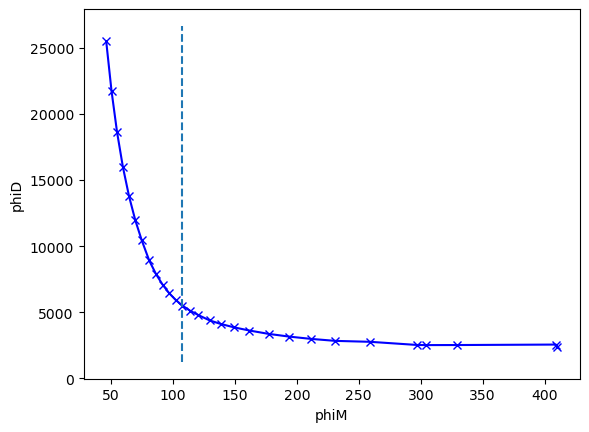

In [100]:
mgr.setMesh(mesh)


mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")
#mgr.inv.setRegularization(2, zWeight=0.9)

lambdas = np.logspace(np.log10(1000), np.log10(1.93), num=29)
phiD = []
phiM = []
for lam in lambdas:
    mgr.invert(data, lam=lam, verbose=True)
    phiD.append(mgr.inv.phiData())
    phiM.append(mgr.inv.phiModel())

phiD = np.array(phiD)
phiM = np.array(phiM)

from kneed import DataGenerator, KneeLocator
kneedle = KneeLocator(phiM, phiD, S=1.0, curve="convex", direction="decreasing",interp_method='interp1d')

print(round(kneedle.elbow, 3))
print(round(kneedle.knee_y, 3))
print(lambdas[np.where(phiM==kneedle.knee)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')


149.203
3853.577
[22.48772434]


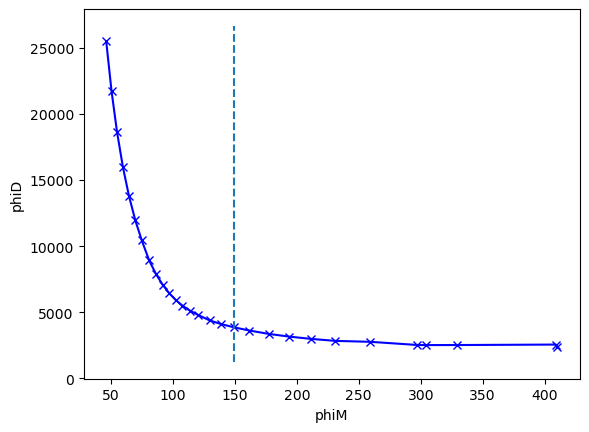

In [101]:
from kneed import DataGenerator, KneeLocator
kneedle = KneeLocator(phiM, phiD, online=True, curve="convex", direction="decreasing",interp_method='polynomial', polynomial_degree=3)

print(round(kneedle.elbow, 3))
print(round(kneedle.elbow_y, 3))
print(lambdas[np.where(phiM==kneedle.elbow)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')



21/02/25 - 20:59:11 - pyGIMLi - INFO - Saving inversion results to: //smb.isipd.dmawi.de/projects/p_subaqua/Expeditions/2023/NWT2023/analysis_Tuk/Tuk_all_mehriban/pygimli/all_inversions/INV_eastern_new_rhoa_mike\ERTManager


Path //smb.isipd.dmawi.de/projects/p_subaqua/Expeditions/2023/NWT2023/analysis_Tuk/Tuk_all_mehriban/pygimli/all_inversions/INV_eastern_new_rhoa_mike\ERTManager already exists. Skipping


('//smb.isipd.dmawi.de/projects/p_subaqua/Expeditions/2023/NWT2023/analysis_Tuk/Tuk_all_mehriban/pygimli/all_inversions/INV_eastern_new_rhoa_mike\\ERTManager',
 <Figure size 1600x1000 with 2 Axes>,
 <Axes: xlabel='$x$ in m', ylabel='Depth in m'>)

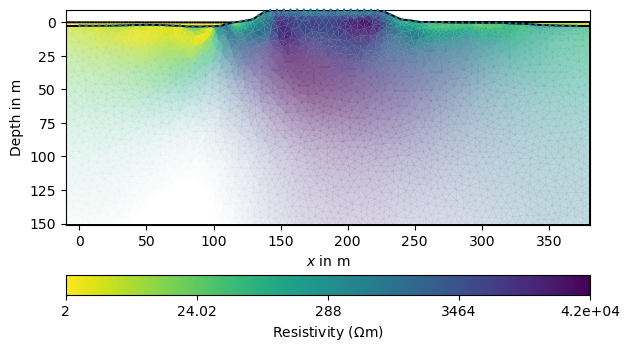

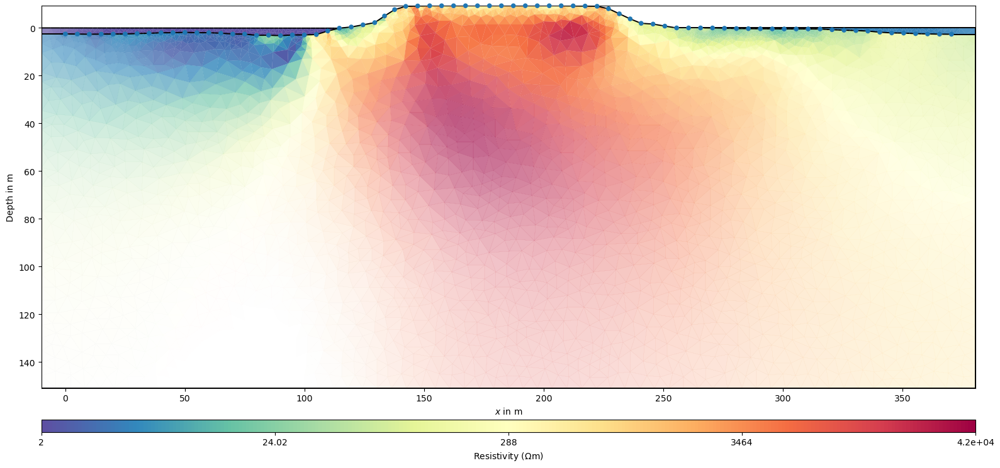

In [121]:
mgr.showResult(cMap="viridis_r", logScale=True)
mgr.saveResult(dir + 'pygimli/all_inversions/INV_eastern_new_rhoa_mike')

In [ ]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[1, 2], trans="log")
mgr.inv.setRegularization(4, limits=[2.5, 5], trans="log")

inv = mgr.invert(lam=20, zWeight=0.5, verbose=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

In [122]:
with open(dir+'processing/shoreline/joined_east.pkl', 'rb') as f:
    joined_east = pickle.load(f)

In [123]:
eastshore = joined_east[['year', 'xc', 'zc']].to_numpy()
eastshore[:, 1] = eastshore[:, 1].round(decimals=0)
eastshore[:, 2] = eastshore[:, 2].round(decimals=1)


In [124]:
posVec2 = [pg.Pos(pos) for pos in zip(eastshore[:, 1], eastshore[:, 2])]
para = pg.Mesh(mgr.paraDomain)
para.setCellMarkers(pg.IVector(para.cellCount()))




fopDP = PriorModelling(para, posVec2)


resMesh = fopDP(mgr.model)



cov = fopDP(mgr.coverage())

east_shoreline_plots = np.column_stack((eastshore[:, 1], eastshore[:, 2], resMesh, eastshore[:, 0], cov,))
east_shoreline_plots = np.c_[ east_shoreline_plots, 2023 - east_shoreline_plots[:, 3] ]
column_titles = "X,Y,ResMesh,Year,Cov,Age"
np.savetxt(
    dir+'processing/shoreline/east_shoreline_plots.csv', 
    east_shoreline_plots, 
    delimiter=',', 
    header=column_titles, 
    comments=''  # Removes the '#' added to the header line by default
)

21/02/25 - 23:23:07 - pyGIMLi - INFO - Found 1 regions.
